# Bayesian Linear Regression

Lets now focus on Bayesian Linear Regression for which the objective consists in determining the relationship between some response variable ${\bf Y}$ and a set of $D$ predictor variables ${\bf X}=(x_1,\ldots,x_D)$ 
* Most common assumption $\rightsquigarrow$ Relation through some deterministic function $f$ and some additive (zero-mean) random error component $\epsilon$
  $${\bf Y}=f({\bf X})+{\bf \epsilon}$$
* In most situations the predictor variables, ${\bf X}$ are assumed to be observed without error so they are not considered as random
  $$\Rightarrow f({\bf X})=\mathbb{E}\left[ {\bf Y} |{\bf X}={\bf x} \right]$$
* Our aim is to determine $f(\cdot)$  so that we can uncover the true relationship between the response ${\bf y}^*$ a at predictor location ${\bf x}^*$ given by ${\bf y}^*=f({\bf x}^*)$<br/>
  <i>(generally only interested in estimating $f$ over some range of plausible predictor values)</i>
* The true regression function is unknown and we have no way of determining its analytic form exactly, even if one actually exists $\Rightarrow$ we must content ourselves with finding approx. to it which are close to the truth by making use of the observed dataset ${\cal D}=\left\{{\bf x}^{(i)},{\bf y}^{(i)}\right\}_{i=1}^N$
* A flexible choice consists in using models using \HIm{basis functions}:
    $$f({\bf x})\approx\sum_{i=1}^k \beta_i {\bf B}_i ({\bf x})$$
    where ${\bf \beta}=(\beta_1,\ldots,\beta_k)^T$ is the set of coefficients corresponding to basis functions ${\bf B}=({\bf B}_1,\ldots,{\bf B}_k)$. Basis functions are nonlinear transformations of the data vector ${\bf x}$ - some examples include: polynomial functions, radial basis functions, etc.
    


Lets assume that we want to model our $N$ data points ${\cal D}=\left\{{\bf x}^{(i)},{\bf y}^{(i)}\right\}_{i=1}^N$ as, $\text{for } j=1,\ldots,N$:
$${\bf y}^{(j)}=\sum_{i=1}^k \beta_i {\bf B}_i ({\bf x}^{(j)})+ \epsilon^{(j)} $$
where $\epsilon^{(j)}\sim {\cal N}({\bf 0}, \sigma^2 {\bf I})$ and for some specific choice of basis functions $\Rightarrow$ this is our choice of model.

In a matrix form, the complete set of observations can be written as follows:
    $${{\bf y}}={\bf B} {\bf \beta}+{ \epsilon}$$
where for univariate input (${x}^{(i)}$) and outputs (${y}^{(i)}$), we have
$${{\bf y}}=\begin{bmatrix}y^{(1)}\\\vdots\\y^{(N)}\end{bmatrix}$$
$${\bf \beta}=\begin{bmatrix}\beta_1\\\vdots\\\beta_k\end{bmatrix}$$
and
$${\bf B}=\begin{bmatrix}B_1(x^{(1)})& B_2(x^{(1)}) & \cdots &  B_k(x^{(1)}) \\
                          \vdots & \ddots & & \vdots  \\
                          B_1(x^{(N)}) & B_2(x^{(N)}) & \cdots & B_k(x^{(N)}) 
                          \end{bmatrix}$$



## Likelihood function

Let us consider that the regression will be performed by choosing the polynomial function as basis functions, i.e. $B_n(x)=x^{n-1}$. As a consequence the matrix ${\bf B}$ is given by:

$${\bf B}=\begin{bmatrix}1& x^{(1)} & \cdots &  {(x^{(1)})}^{k-1} \\
                          \vdots & \ddots & & \vdots  \\
                          1 & x^{(N)} & \cdots & {(x^{(N)})}^{k-1} 
                          \end{bmatrix}$$

Moreover, the error term vector $\epsilon$ in the model is assumed to follows a <a href="https://en.wikipedia.org/wiki/Multivariate_normal_distribution" target="_blank">multivariate normal distribution</a> with (**known and fixed**) covariance matrix $\Sigma_y(=\sigma^2 {\bf I})$. The likelihood function is therefore defined as follows:

\begin{align}
\begin{split}
p({\bf y}|{\bf \beta},{\bf x})&={\cal N}({\bf y};{\bf B}\beta,\Sigma_y)\\
&=\frac{1}{(2\pi)^{N/2} |\Sigma_y|^{1/2}}\exp\left(-\frac{1}{2}({\bf y}-{\bf B}\beta)^T \Sigma_y^{-1} ({\bf y}-{\bf B}\beta) \right)
\end{split}
\end{align}
where $|\Sigma_y|$ is the determinant of the matrix $\Sigma_y$.

## Prior distributions on unknown parameters $\beta$

A multivariate normal distribution will be chosen as prior distribution for the unknown random vector $\beta$. Different choices can be made but the Gaussian assumption is the one typically used in this setting due to the nice identities we have with this distribution - to be more precise in the vocabulary, we use the conjugacy property of this distribution under the defined likelihood. 

The prior distribution for the unknown parameters is then defined as:
\begin{align}
\begin{split}
p({\bf \beta})&={\cal N}({\bf \beta};{\bf \mu_\beta},\Sigma_\beta)\\
&=\frac{1}{(2\pi)^{k/2} |\Sigma_\beta|^{1/2}}\exp\left(-\frac{1}{2}(\beta- \mu_\beta)^T \Sigma_\beta^{-1} (\beta- \mu_\beta) \right)
\end{split}
\end{align}
where $\mu_\beta$ and $\Sigma_\beta$ are the mean vector and covariance matrix of the prior on $\beta$. Without any specific a priori knowledge on $\beta$, one typically chooses zero mean $\mu_\beta={\bf 0}$ and independent components with the same variance $\Sigma_\beta=\sigma_\beta^2{\bf I}$ 

## Numerical Examples

In this section, the regression will be performed by assuming
* independent training samples: $\Sigma_y=\sigma_y^2 {\bf I}$ in the likelihood,
* zero mean and independent regression coefficients $\beta_i$: $\mu_\beta={\bf 0}$ and $\Sigma_\beta=\sigma_\beta^2{\bf I}$ in the prior of $\beta$ 

In [213]:
import sys

import numpy as np
import matplotlib.pyplot as plt
import scipy.stats



def plot_posterior(mean, variance,indexComponent, ax=None):
    x = np.linspace(-20, 20, 10000)
    y = scipy.stats.norm.pdf(x, mean, np.sqrt(variance))
        
    if not ax:
        fig, ax = plt.subplots()
    ax.plot(x, y)
    ax.set_xlabel(r"$\beta_{}$".format(indexComponent+1), fontsize=20)
    ax.set_ylabel(r"$P(\beta_{}|\cal D)$".format(indexComponent+1), fontsize=20)
    ax.set_title(r"Marginal Posterior of $\beta_{}$".format(indexComponent+1), fontsize=20);


In [214]:
# Definition of the true function

def TrueFunc(x):
    return np.sin(4.5*x)



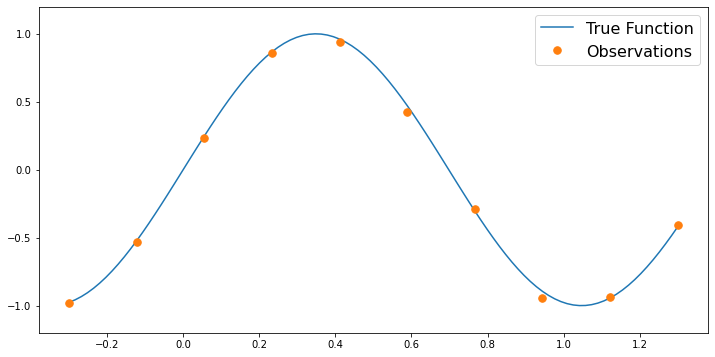

In [215]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 10
trueNoiseStd = 2e-2
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

In [216]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  20# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)

In [217]:
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

### Predictive Prior

Lets talk a look at the predictive prior - what will be our prediction without any training data.

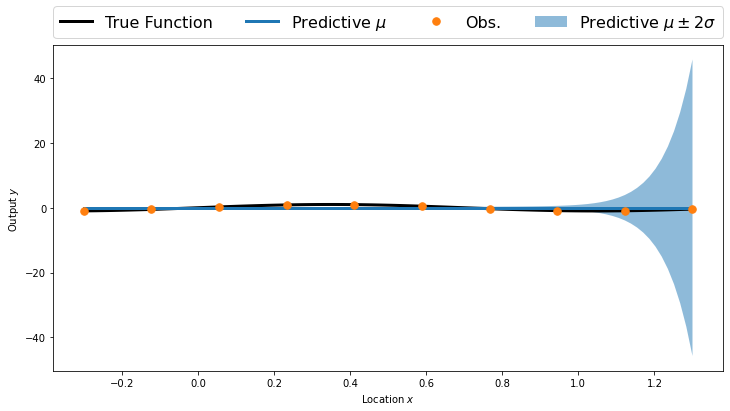

In [218]:
predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

<span style='font-weight:bold;color:red'> -------------------------- <br/>
    Question 1 - Comment these results.<br/> -------------------------- </span> 
    
La variance de notre fonction prédictive à priori est proche de 0 quand x appartient à l'intervalle ]-0.3,1.1[, elle croit ensuite sur l'intervalle ]1.1,1.3[ jusqu'à atteindre 400. Puisque (40/2)^2 = 400.

### Posterior Distribution

Lets now compute the posterior distribution - as seen in the lecture, due to the conjugacy property of the Gaussian assumption of both the prior and the likelihood, the posterior distribution of the parameters $\beta$, $p(\beta|{\bf y},{\bf x})$ will also be a multivariate normal distribution, i.e.

$$p(\beta|\underbrace{{\bf y},{\bf x}}_{\cal D})={\cal N}({\bf \beta};{\bf \tilde{\mu}_\beta},\tilde{\Sigma}_\beta)$$
where
\begin{align}
\begin{split}
\tilde{\mu}_\beta & = {\mu}_\beta + {\Sigma}_\beta {\bf B}^T [{\bf B}{\Sigma}_\beta {\bf B}^T + {\Sigma}_y]^{-1} ({\bf y}-{\bf B}{\mu}_\beta) \\
\tilde{\Sigma}_\beta &= \left({\bf I}-{\Sigma}_\beta {\bf B}^T [{\bf B}{\Sigma}_\beta {\bf B}^T + {\Sigma}_y]^{-1} {\bf B}\right) {\Sigma}_\beta
\end{split}
\end{align}

2.564799469226374e-11


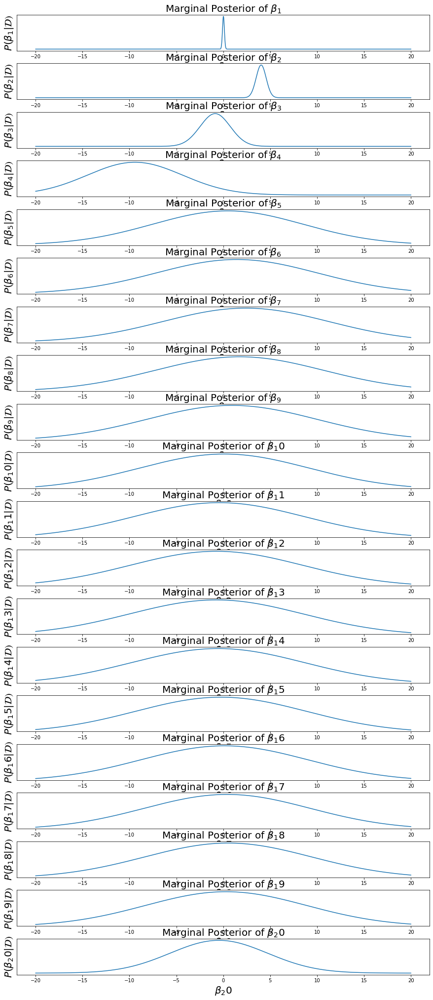

In [219]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()


<span style='font-weight:bold;color:red'> -------------------------- <br/>
    Question 2 - Comment these results.<br/> -------------------------- </span> 

Toutes les distributions postérieures marginales suivent une loi normale.

On peut ci-dessus observer les 20 distibutions postérieures marginales.

Vraisembablement, on observe que :

La première suit une loi normale de moyenne valant approximativement 0 et de variance valant approximativement 1.

La seconde suit une loi normale de moyenne valant approximativement 4 et de variance valant approximativement 1.5.

La troisième suit une loi normale de moyenne valant approximativement -1 et de variance valant approximativement 4.

La quatrième suit une loi normale de moyenne valant approximativement -9 et de variance valant approximativement 15.

De la cinquième à la dix-neuvième distribution, les distributions suivent une loi normale de moyenne comprise entre 1 et 0, et de variance valant approximativement 20.

La vingtième suit une loi normale de moyenne valant approximativement 0 et de variance valant approximativement 20.

### Predictive Posterior Distribution

Lets now compute the predictive posterior distribution. This distribution allows us to obtain the full distribution (with a measure of uncertainty) of the response $y^*$ at some new predictor value $x^*$. As seen in the lecture, this pdf is given by:
$$p(y^*|x^*,{\cal D})=\int p(y^*|x^*,\beta,{\cal D}) {p(\beta|{\cal D})} d\beta $$
where ${\cal D}=\left\{{\bf x}^{(i)},{\bf y}^{(i)}\right\}_{i=1}^N$ is the full training set. From our results derived before, the posterior distribution of the parameters $p(\beta|{\cal D})$ is a multivariate normal distribution 


- as seen in the lecture, due to the conjugacy property of the Gaussian assumption of both the prior and the likelihood, the posterior distribution of the parameters $\beta$,  will also be a multivariate normal distribution - more precisely $$p(\beta|{\bf y},{\bf x})={\cal N}({\bf \beta};{\bf \tilde{\mu}_\beta},\tilde{\Sigma}_\beta)$$ 

- observations $y*$ are assumed to be independent given $\beta$ and the location $x^*$ and have the following linear form:
 $${{y}^*}={\bf b}_{x^*}{\bf \beta}+{ \epsilon}$$
with $\epsilon \sim {\cal N}({\bf 0}, \sigma^2 )$ and ${\bf b}_{x^*}=\begin{bmatrix}B_1(x^*)& B_2(x^*) & \cdots &  B_k(x)
                          \end{bmatrix}$
                          
                          
                          
As a consequence, it is obvious that the predictive posterior distribution of the new response $y^*$ at a new location $x^*$ is given by:
$$p(y^*|x^*,{\cal D})={\cal N}\left(y^*; {\bf b}_{x^*}{\bf \tilde{\mu}_\beta}, {\bf b}_{x^*} \tilde{\Sigma}_\beta {\bf b}_{x^*}^T + \sigma^2 \right)$$

In [220]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

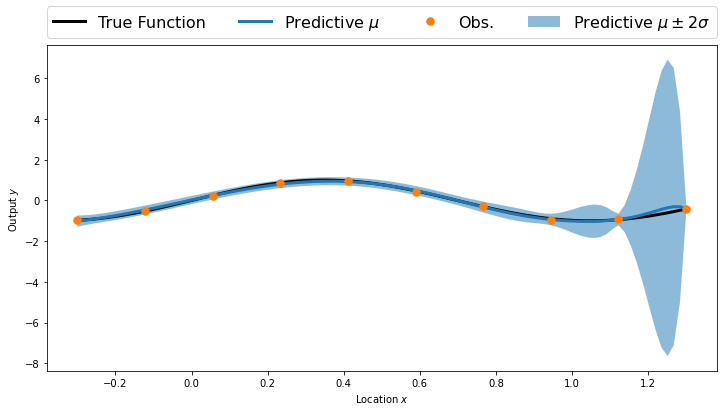

In [221]:
plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

<span style='font-weight:bold;color:red'> -------------------------- <br/>
    Question 3 - Comment these results.<br/> -------------------------- </span> 
 
Pour x appartenant à l'intervalle ]-0.3,0.9[ on a une variance proche de 0 pour notre fonction prédictive postérieure.

On peut voir que la variance est proche de 0 quand x est assez proche d'une observation.

Et que quand x est plus grand que la huitième observation, plus il s'éloigne des deux observations qui lui sont les plus proches, plus la variance de notre fonction prédictive postérieure est grande. Ce phénomène étant plus prononcé encore entre les observations 9 et 10 qu'entre les observations 8 et 9.

La variance atteint environ (7/2)^2 = 12.25 , au maximum, pour x appartenant à ]1.2,1.3[. Ce qui est plus petit que la variance que pouvait atteindre notre fonction prédictive à priori sur ce même intervalle.

<span style='font-weight:bold;color:red'> -------------------------- <br/>
    Question 4 - Create code cells below by changing the value respectively of  </span> 
    <ul>
       <span style='font-weight:bold;color:red'> <li> the noise level $\sigma^2$ in the data</li>
        <li>the order of polynoms $k$ </li>
        <li>the number of data samples $N$ </li>
    </span>
    </ul>
   <span style='font-weight:bold;color:red'> Try to understand the impact of each of these values. <br/>
    What could be a measure that could be used to decide between all these different choices (i.e. choice of parameters) ? Implement the computation of such criterion. <br/> -------------------------- </span> 



On prendra les valeurs 10 , 20 , 30 pour numObs , le nombre d'observations.
On prendra les valeurs 2e-3 , 7e-3 , 2e-3 pour trueNoiseStd , le bruit.
On prendra les valeurs 10 , 15 , 20 pour polyOrder , le nombre de distributions marginales posterieures.

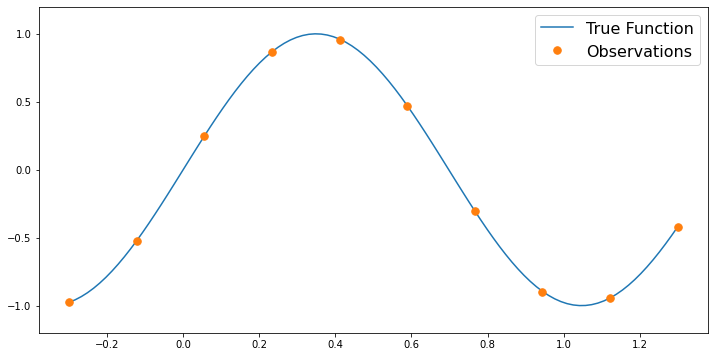

In [299]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 10
trueNoiseStd = 2e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

In [300]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  10# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)

In [301]:
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

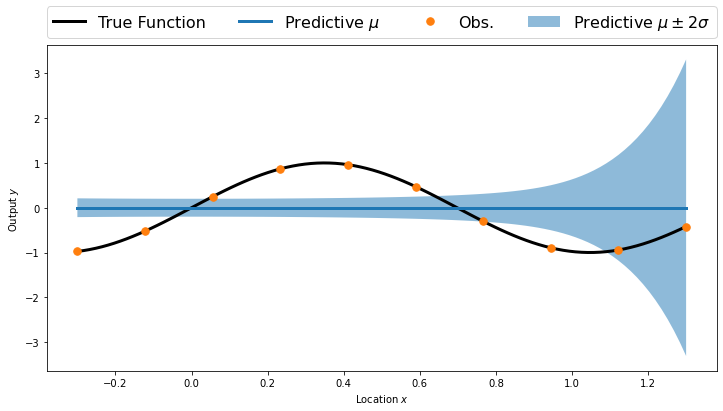

In [302]:
predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

1.747015991754835e-06


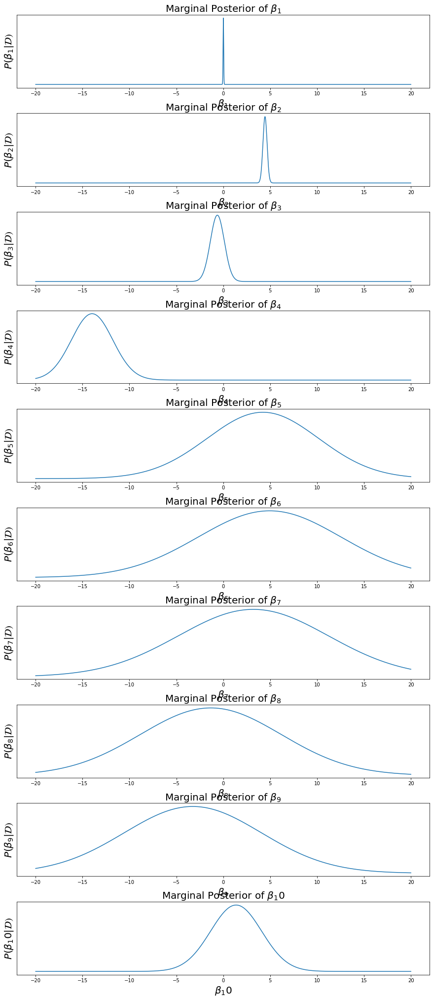

In [303]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()


In [304]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

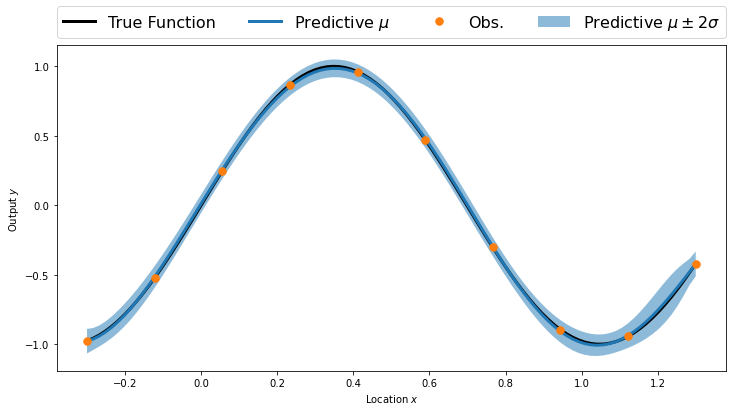

In [305]:
plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [306]:
Loss11 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss21 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss11 , Loss21

(0.008906455, 5121.7715)

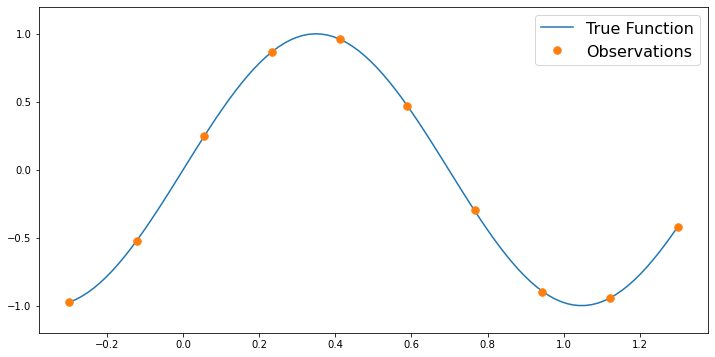

In [307]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 10
trueNoiseStd = 2e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

In [308]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  15# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)

In [309]:
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

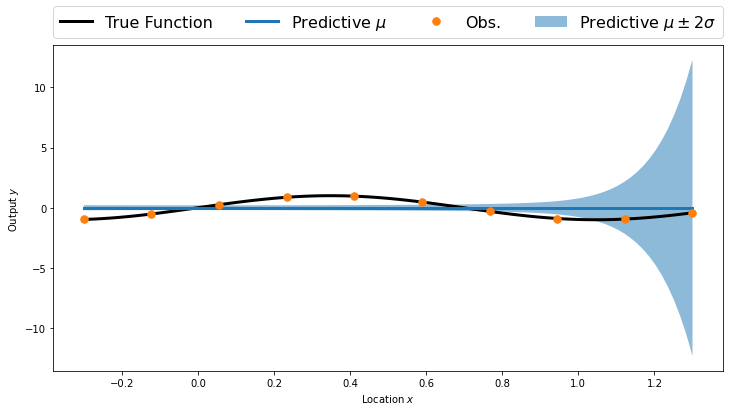

In [310]:
predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

1.0333707101240072e-08


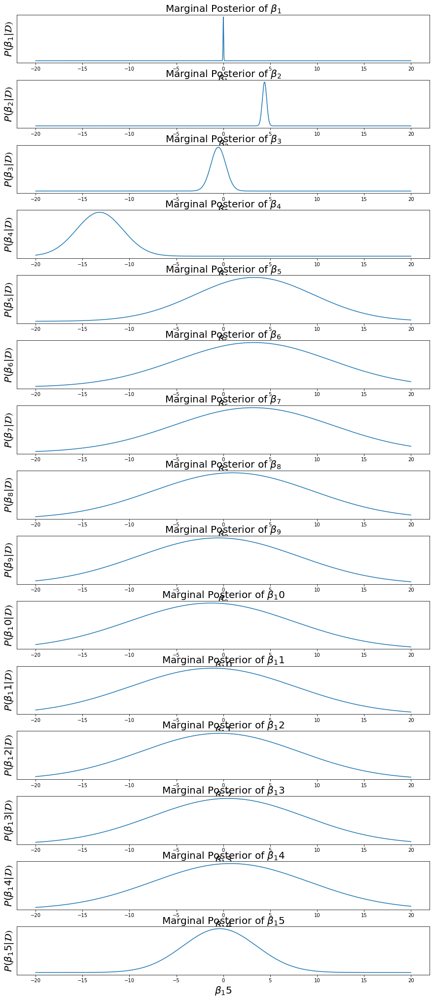

In [311]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()


In [312]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

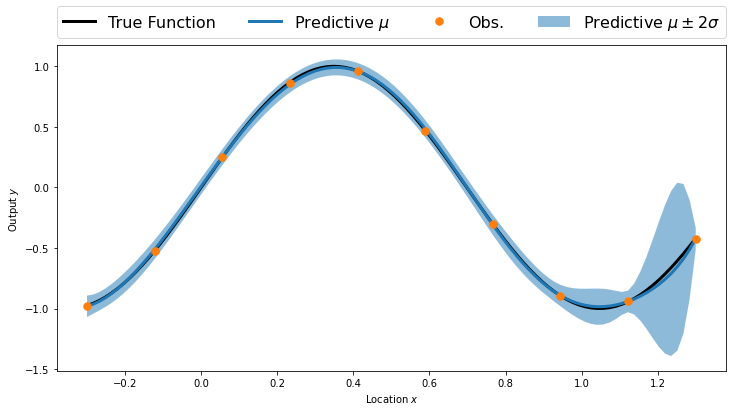

In [313]:
plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [314]:
Loss12 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss22 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss12 , Loss22

(0.019897131, 5126.368)

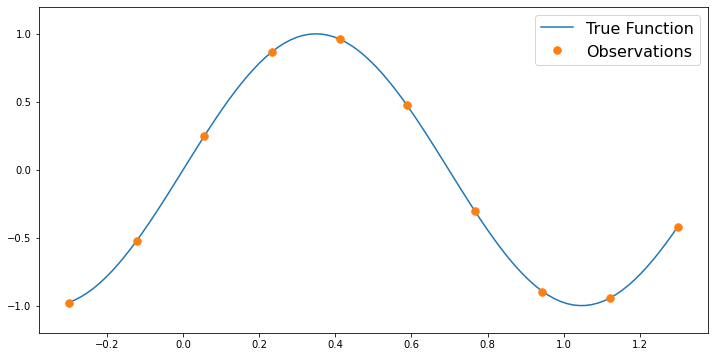

In [315]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 10
trueNoiseStd = 2e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

In [316]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  20# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)

In [317]:
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

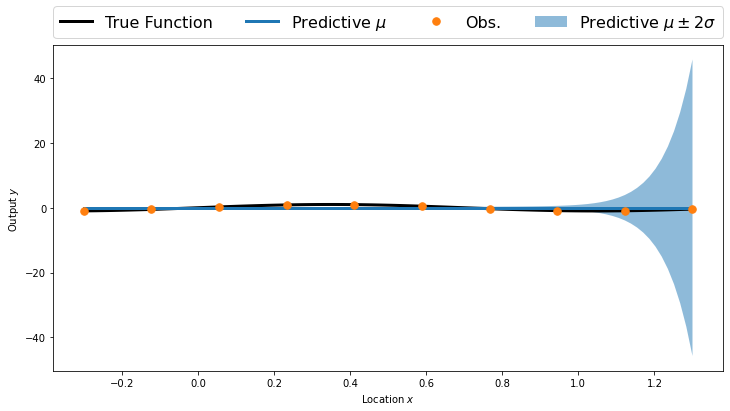

In [318]:
predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

2.168939039498369e-10


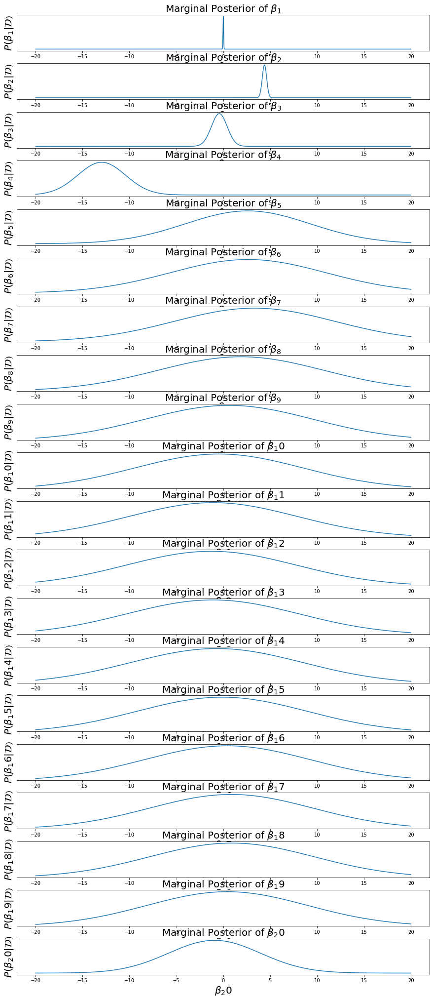

In [319]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()


In [320]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

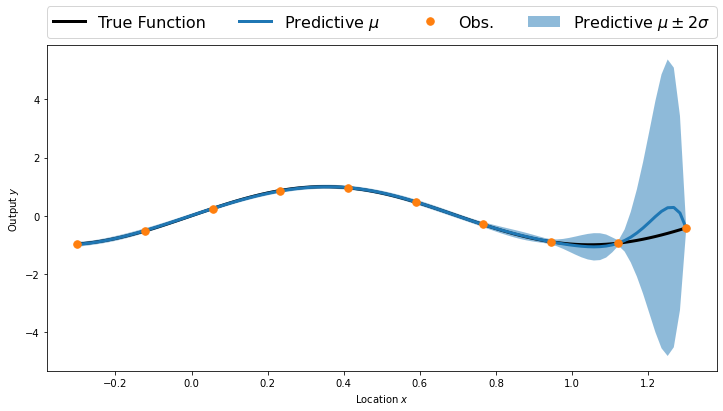

In [321]:
plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [322]:
Loss13 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss23 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss13 , Loss23

(3.4927654, 6223.1313)

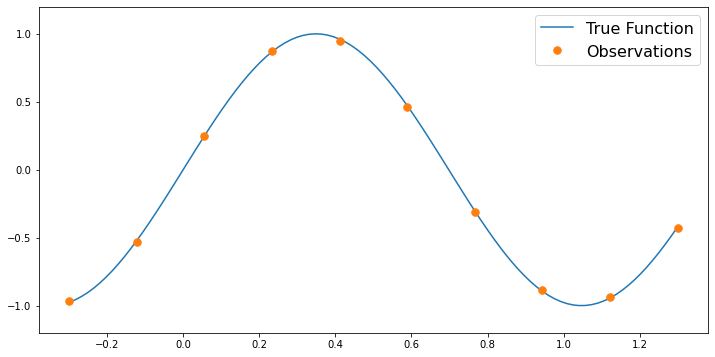

In [323]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 10
trueNoiseStd = 7e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

In [324]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  10# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)

In [325]:
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

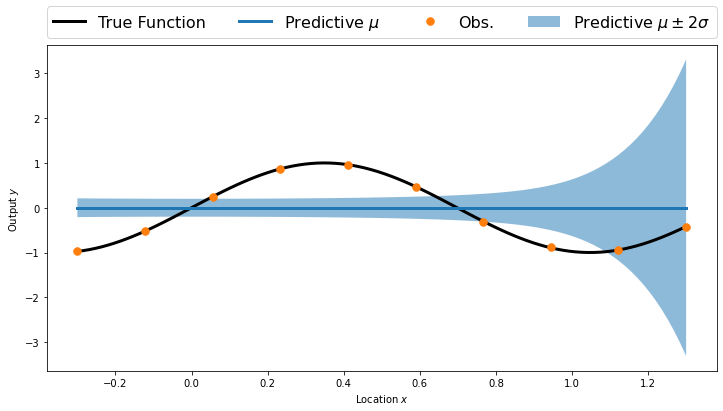

In [326]:
predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

2.8804357338861387e-07


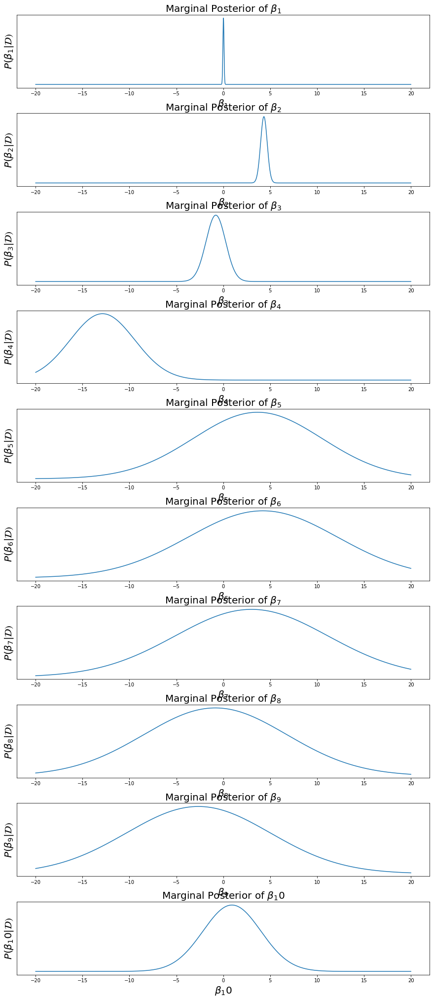

In [327]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()


In [328]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

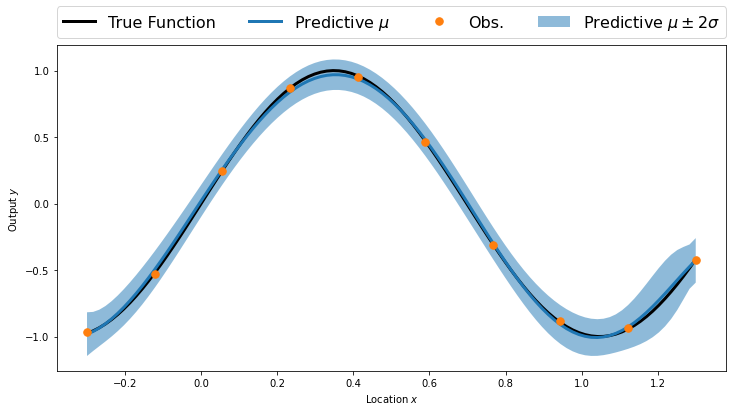

In [329]:
plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [330]:
Loss14 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss24 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss14 , Loss24

(0.036287885, 5122.977)

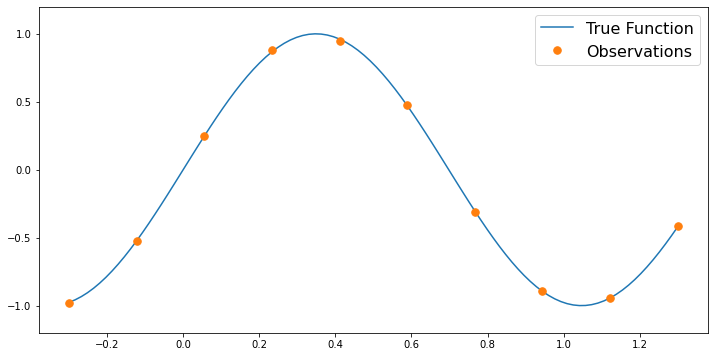

In [331]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 10
trueNoiseStd = 7e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

In [332]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  15# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)

In [333]:
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

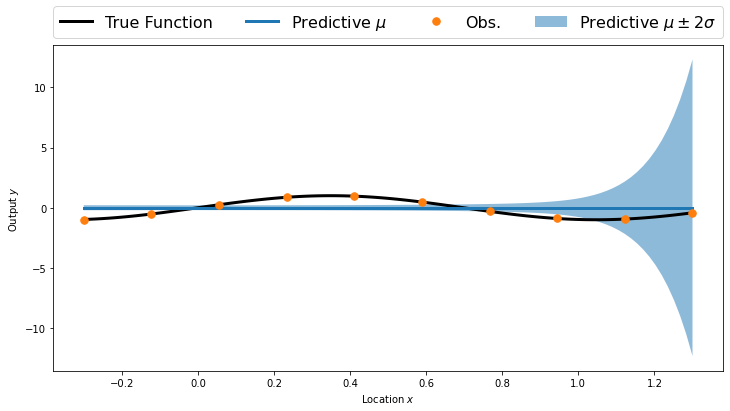

In [334]:
predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

3.0553684357133756e-09


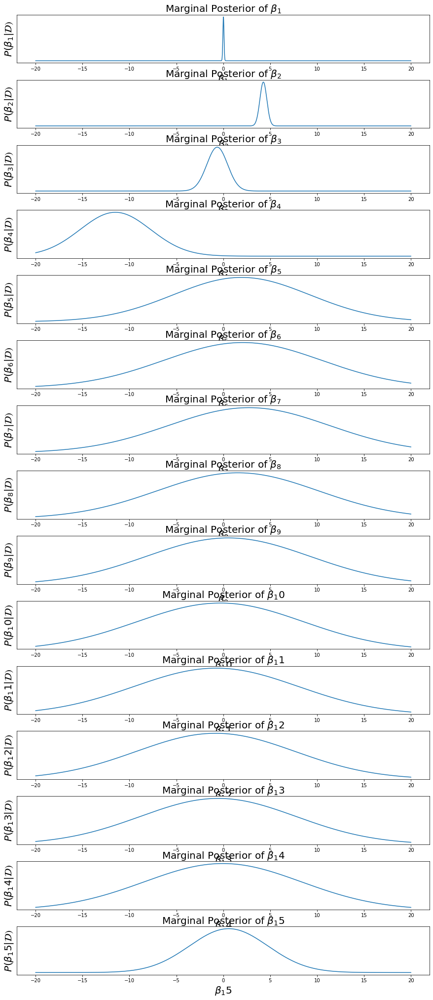

In [335]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()


In [336]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

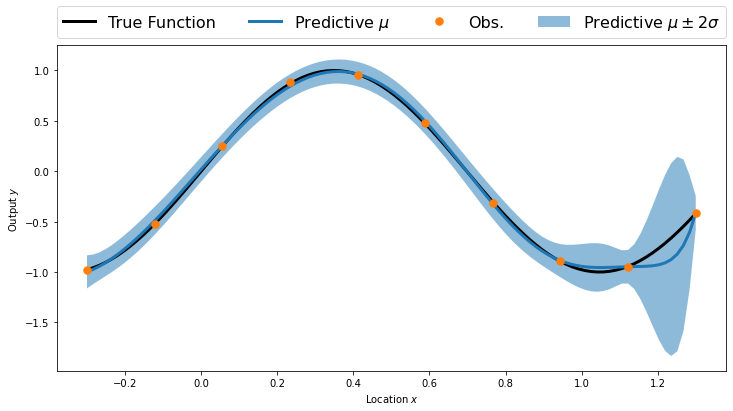

In [337]:
plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [338]:
Loss15 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss25 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss15 , Loss25

(0.2752857, 5132.5005)

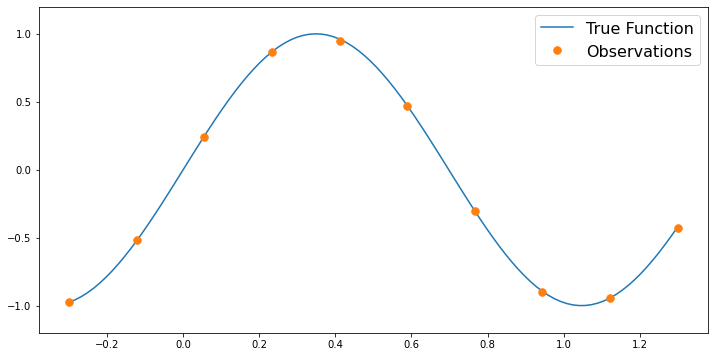

In [339]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 10
trueNoiseStd = 7e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

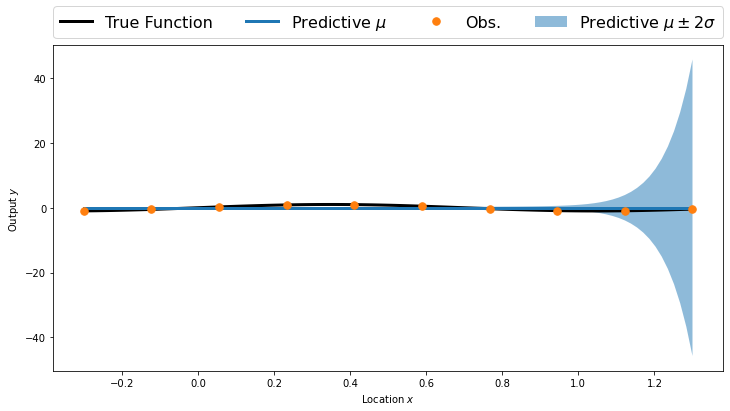

In [340]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  20# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

7.734347779301127e-11


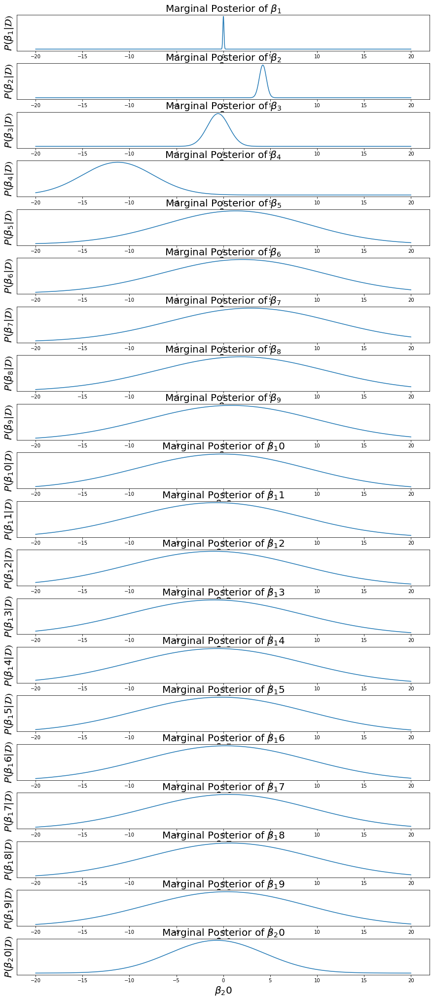

In [341]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()


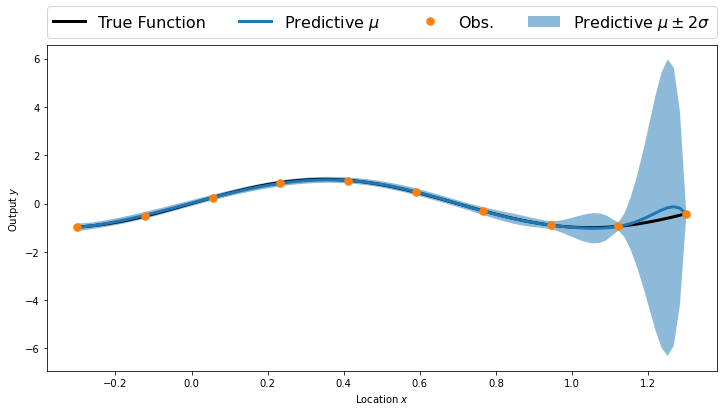

In [342]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [343]:
Loss16 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss26 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss16 , Loss26

(0.8334709, 7310.575)

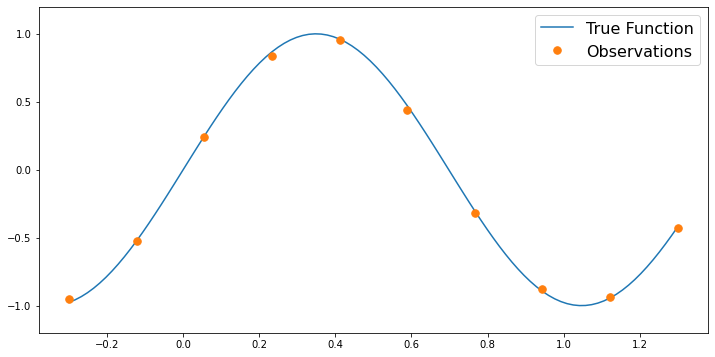

In [344]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 10
trueNoiseStd = 2e-2
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

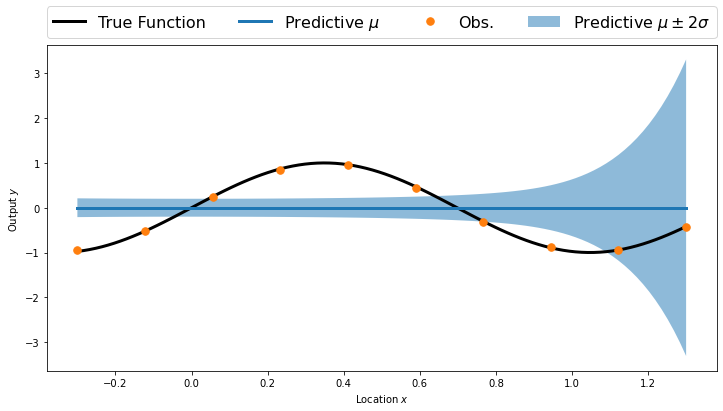

In [345]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  10# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

7.151735628218057e-08


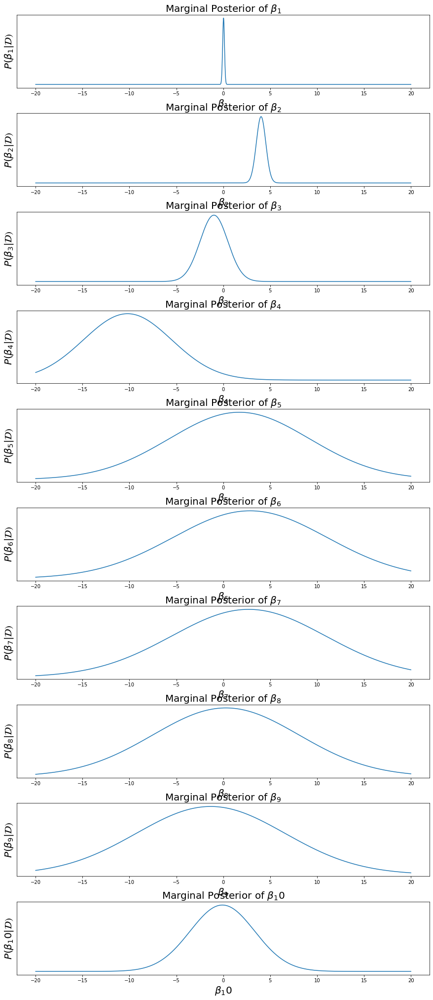

In [346]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()


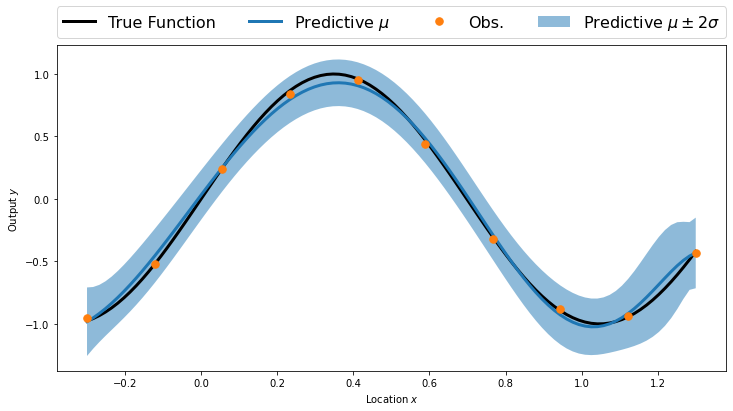

In [347]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [348]:
Loss17 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss27 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss17 , Loss27

(0.1961918, 5125.7524)

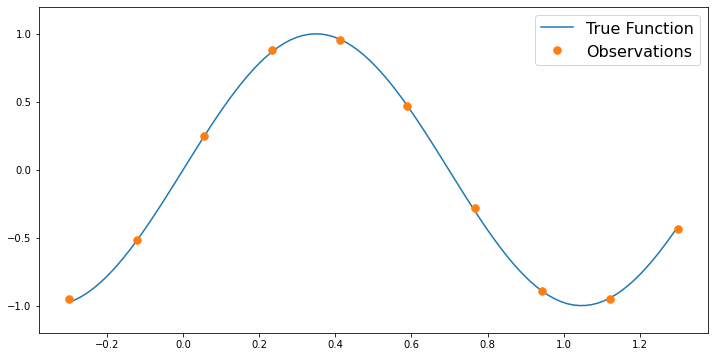

In [349]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 10
trueNoiseStd = 2e-2
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

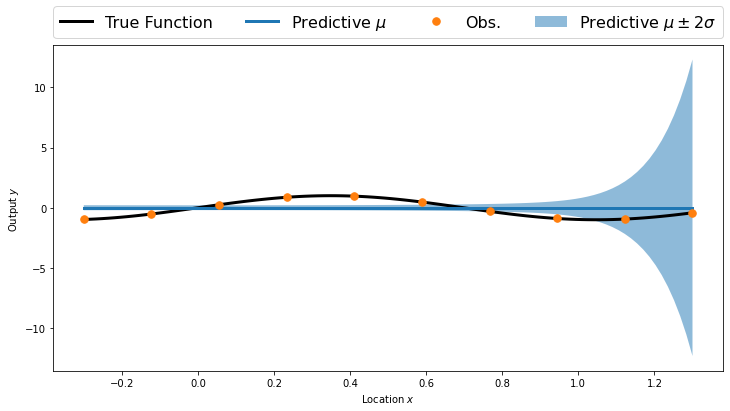

In [350]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  15# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

9.194383373209648e-10


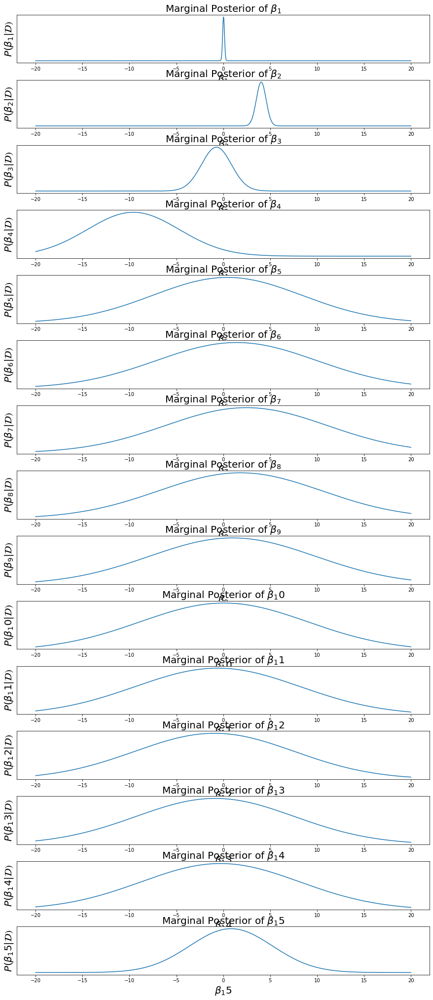

In [351]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()


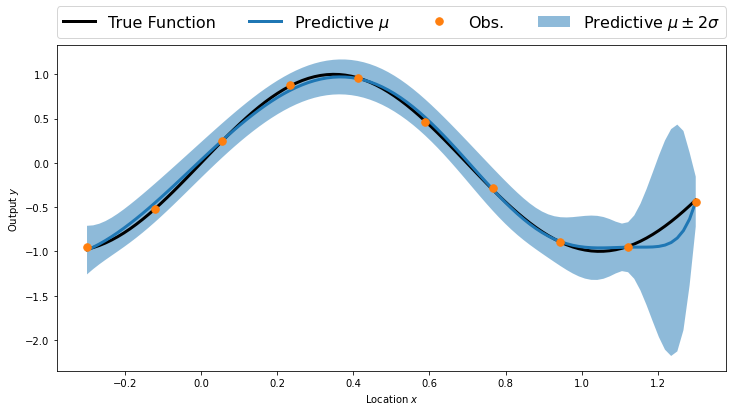

In [352]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [353]:
Loss18 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss28 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss18 , Loss28

(0.40641618, 5145.7627)

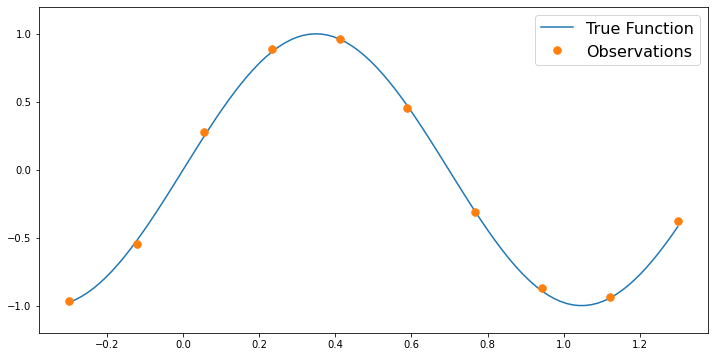

In [355]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 10
trueNoiseStd = 2e-2
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

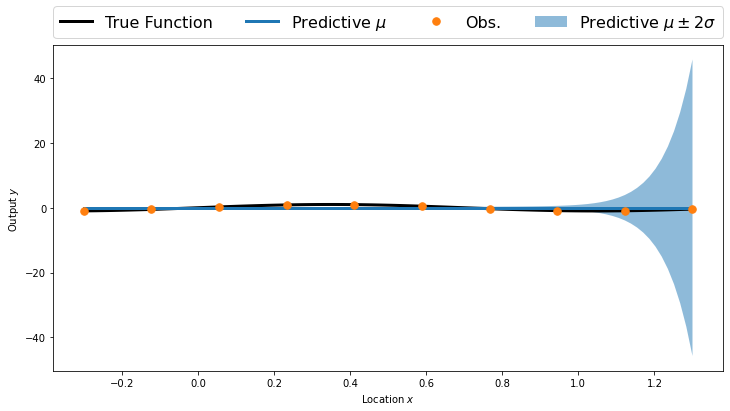

In [356]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  20# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

2.382866938381742e-11


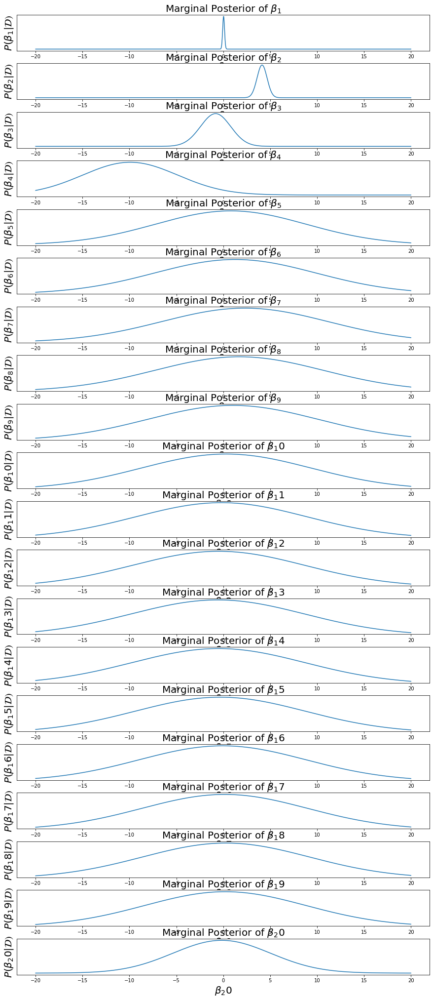

In [357]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

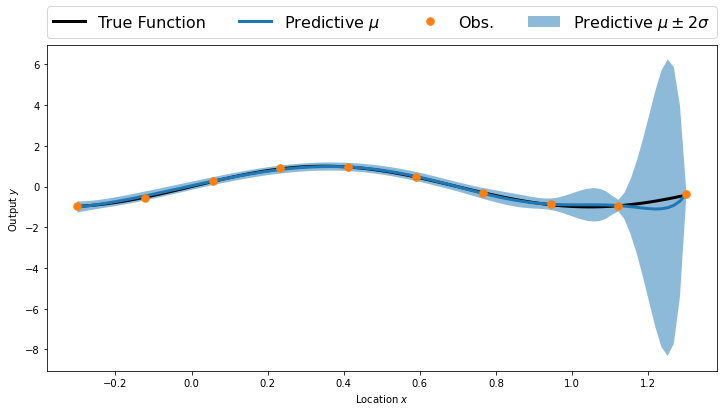

In [358]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [359]:
Loss19 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss29 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss19 , Loss29

(1.0653485, 9352.105)

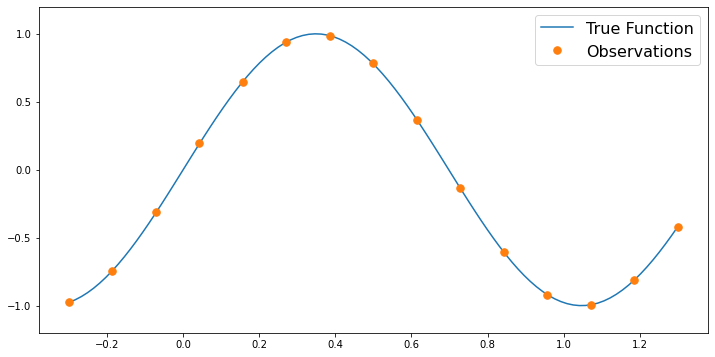

In [360]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 15
trueNoiseStd = 2e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

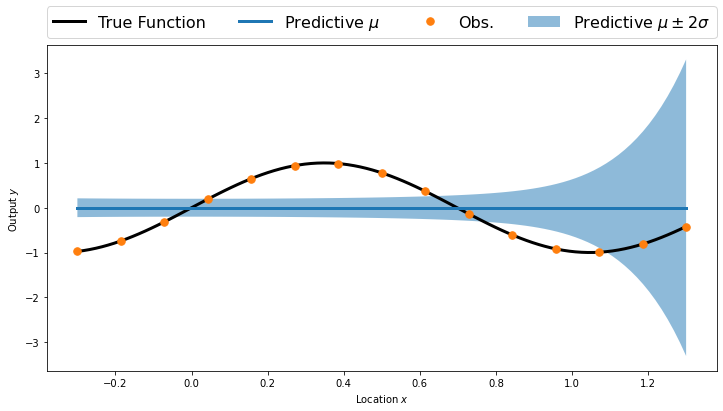

In [361]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  10# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

0.01921685844791822


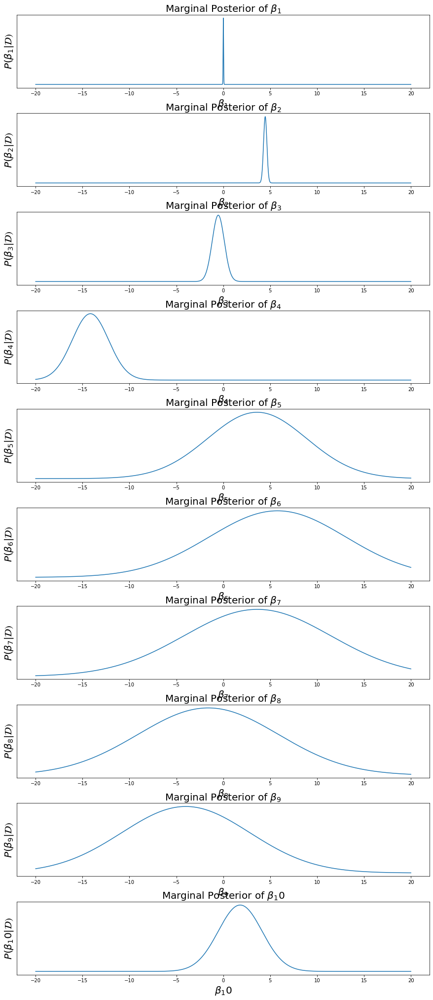

In [362]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

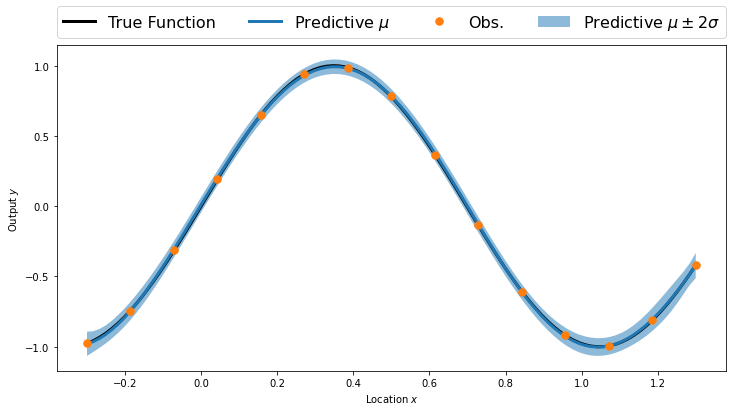

In [363]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [364]:
Loss110 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss210 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss110 , Loss210

(0.0036039457, 5121.491)

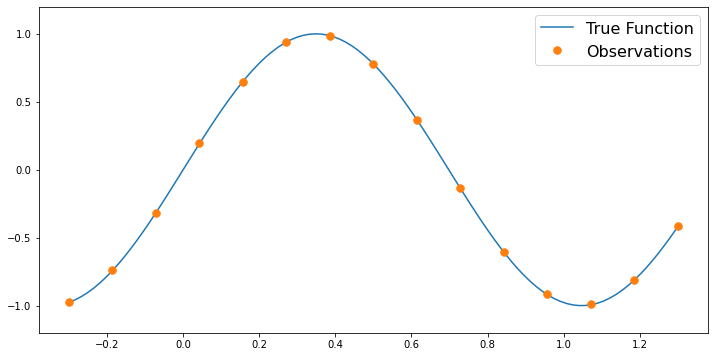

In [370]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 15
trueNoiseStd = 2e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

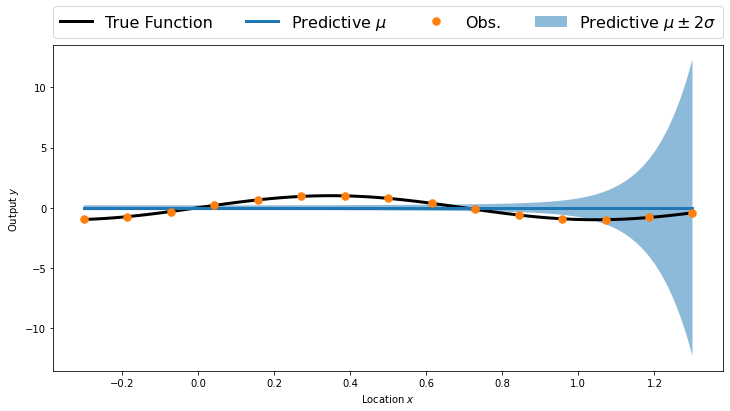

In [371]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  15# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

4.0542058350525576e-05


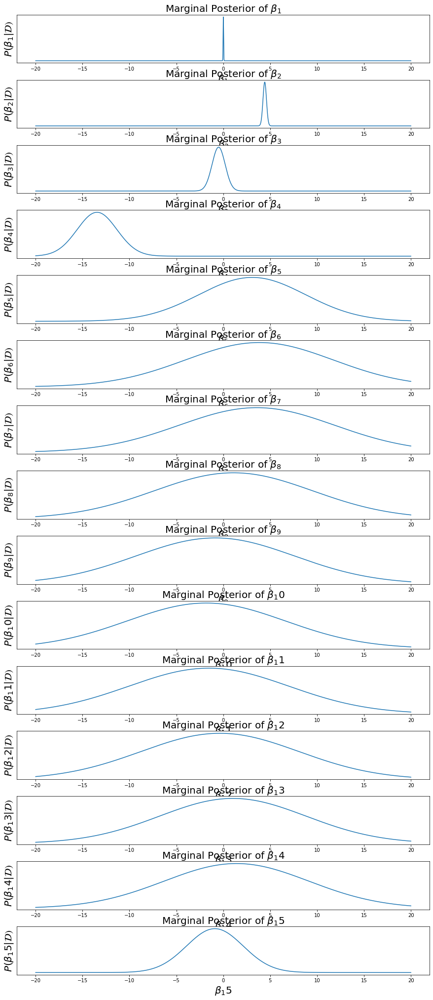

In [372]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

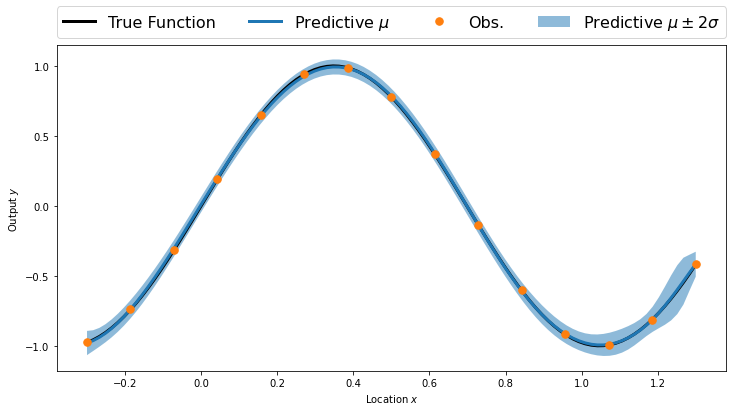

In [373]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [374]:
Loss111 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss211 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss111 , Loss211

(0.003994103, 5121.556)

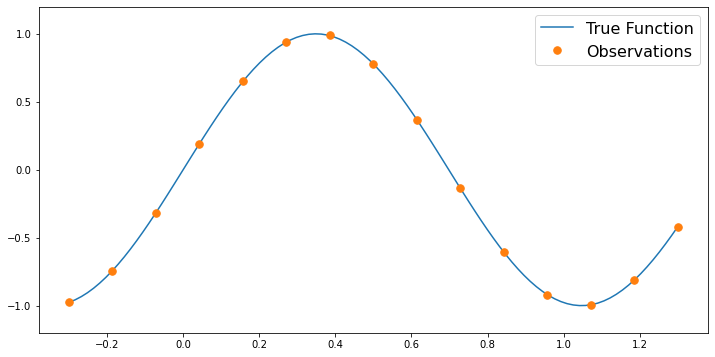

In [375]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 15
trueNoiseStd = 2e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

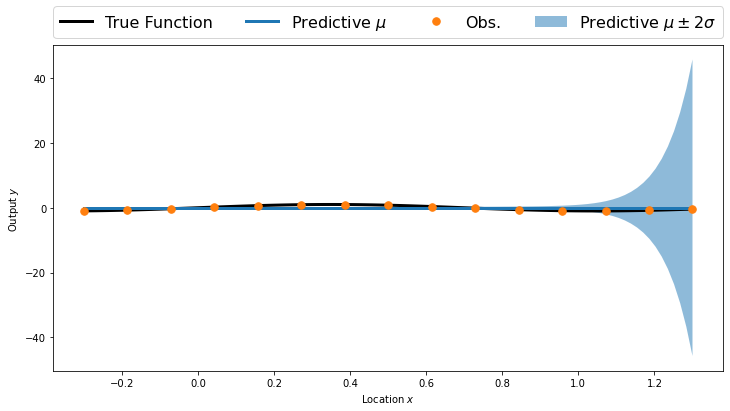

In [376]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  20# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

1.6182117140220956e-07


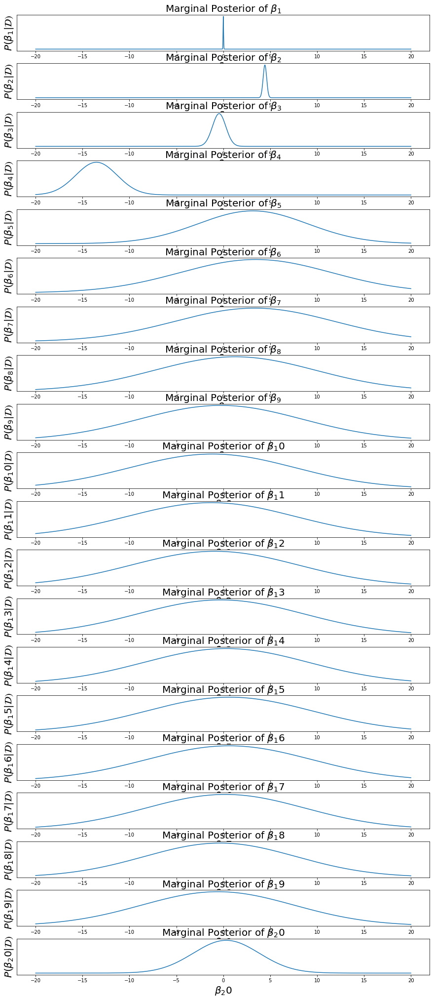

In [377]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

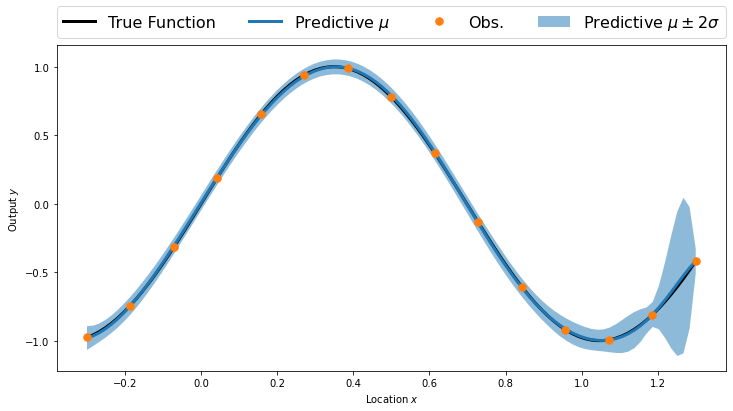

In [378]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [379]:
Loss112 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss212 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss112 , Loss212

(0.0049697487, 5122.6064)

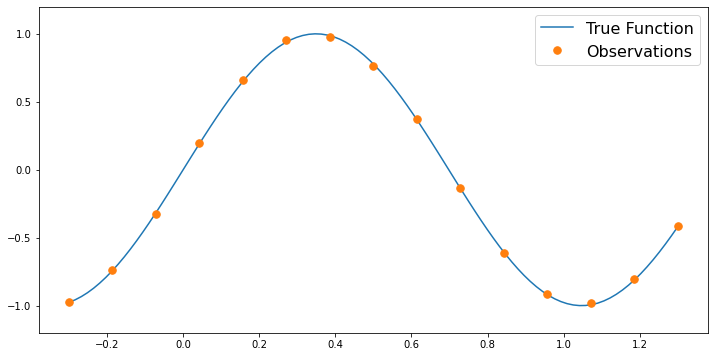

In [380]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 15
trueNoiseStd = 7e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

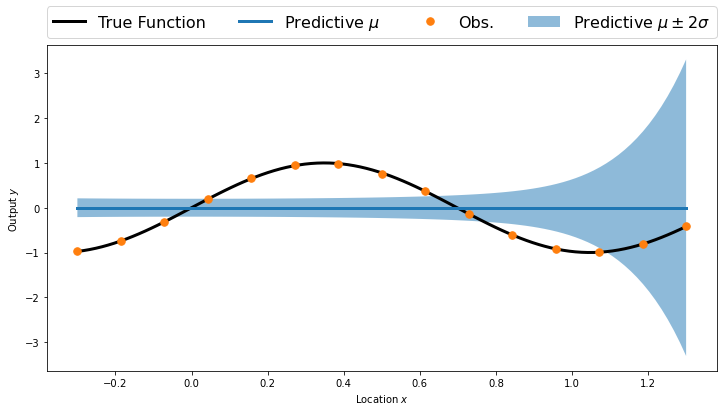

In [381]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  10# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

0.00016180211692357952


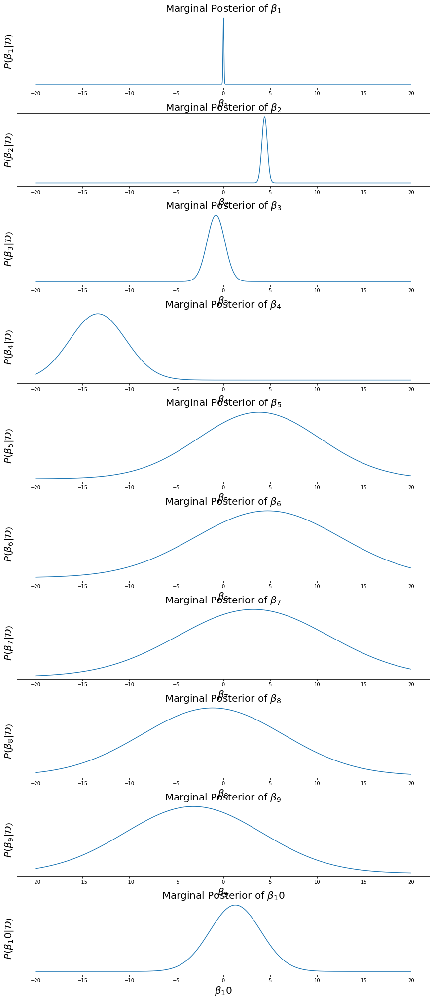

In [382]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

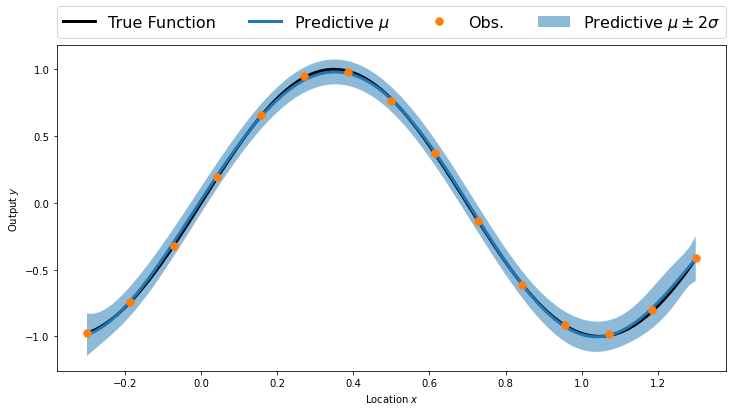

In [383]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [384]:
Loss113 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss213 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss113 , Loss213

(0.018377397, 5122.1274)

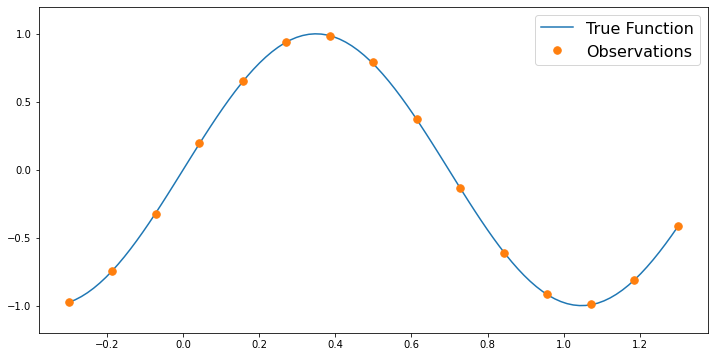

In [385]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 15
trueNoiseStd = 7e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

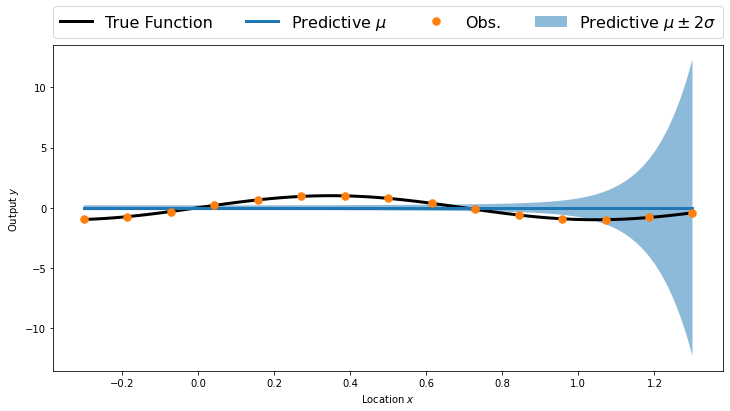

In [386]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  15# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

6.627287143486845e-07


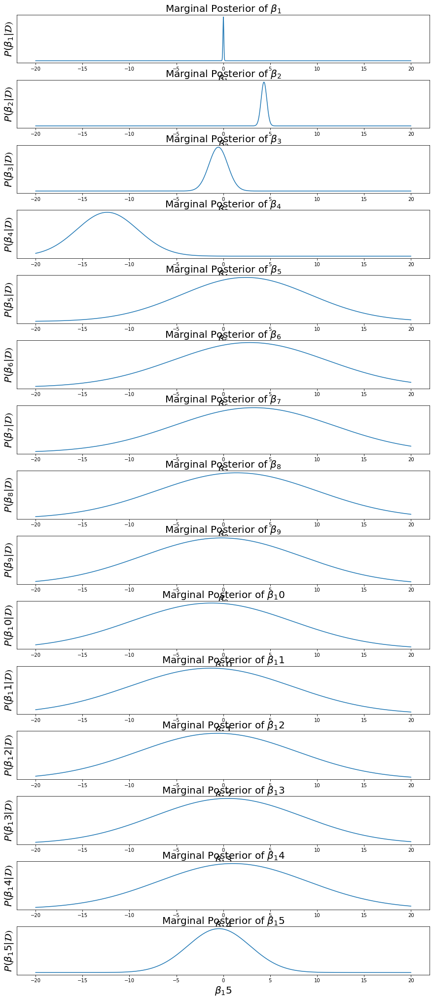

In [387]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

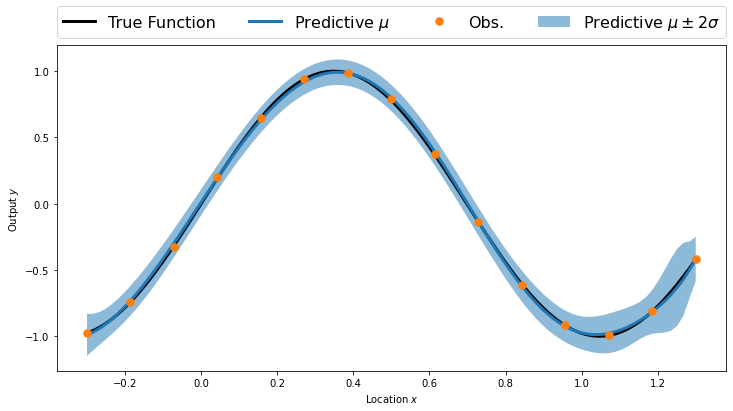

In [389]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [390]:
Loss114 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss214 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss114 , Loss214

(0.020315913, 5122.3)

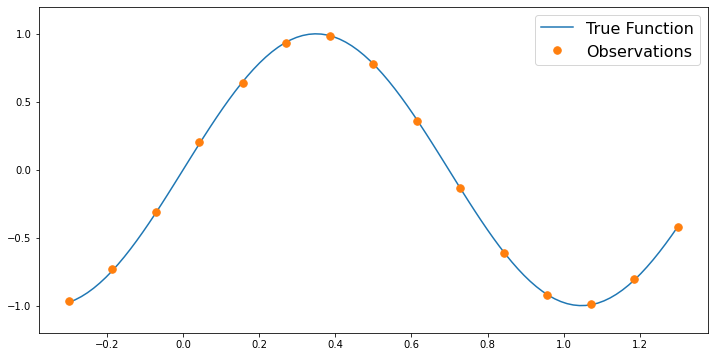

In [391]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 15
trueNoiseStd = 7e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

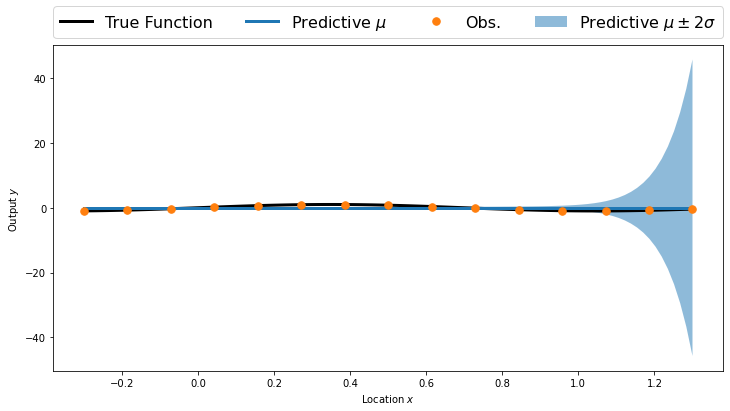

In [392]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  20 # number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

4.682075152876395e-09


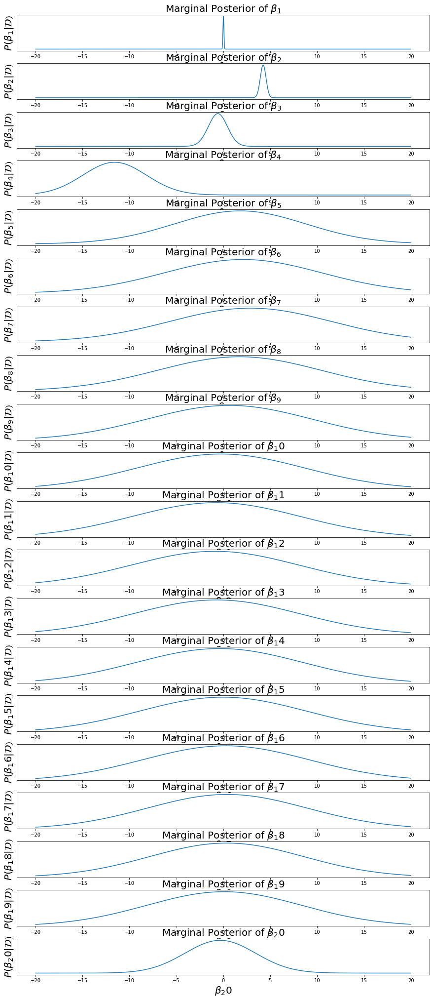

In [393]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

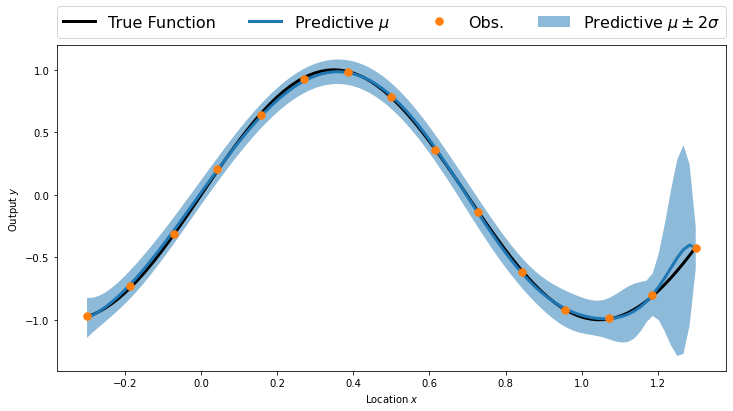

In [394]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [395]:
Loss115 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss215 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss115 , Loss215

(0.06704466, 5124.678)

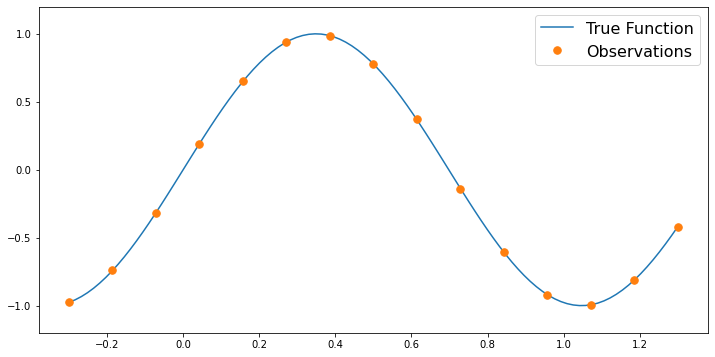

In [396]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 15
trueNoiseStd = 2e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

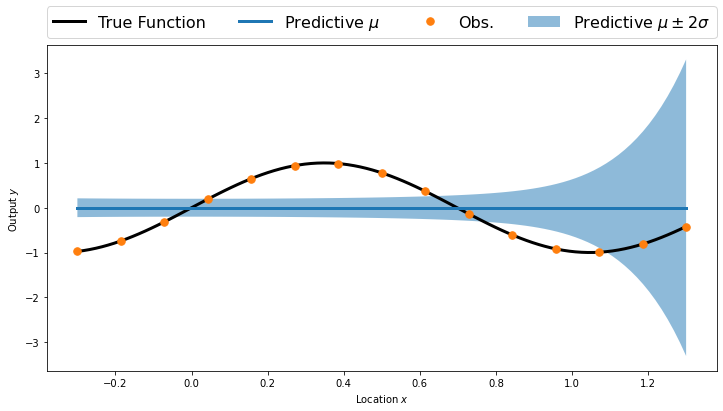

In [397]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  10# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

0.018830472331759968


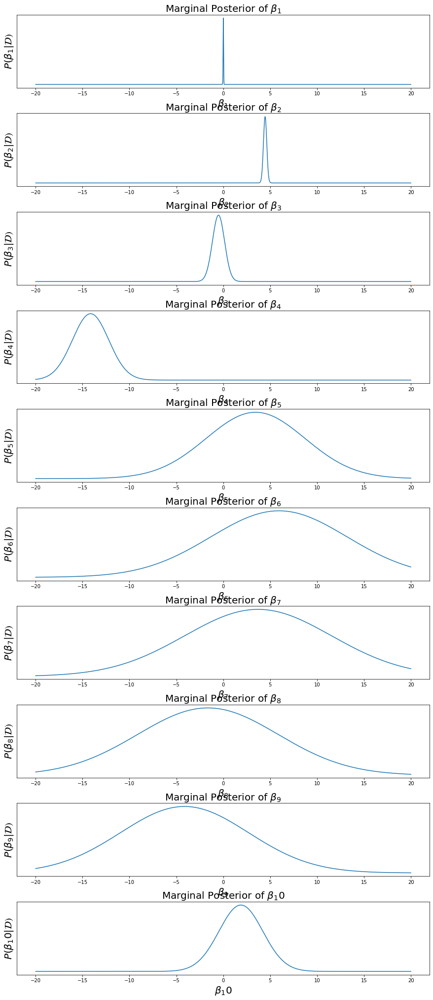

In [398]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

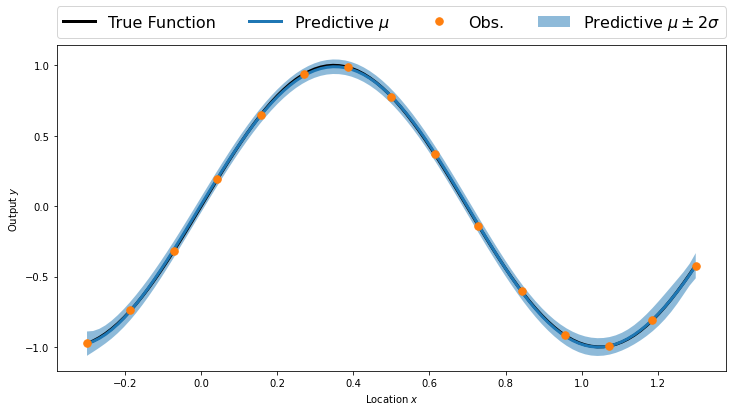

In [399]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [400]:
Loss116 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss216 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss116 , Loss216

(0.0032685036, 5121.491)

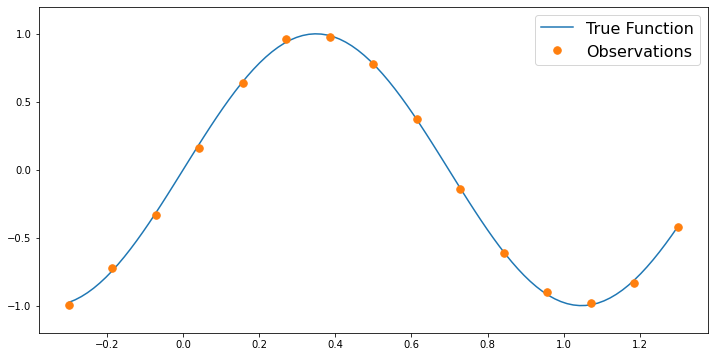

In [411]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 15
trueNoiseStd = 2e-2
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

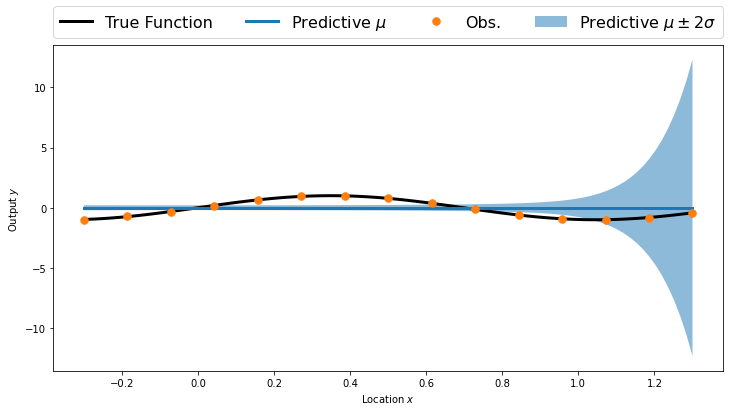

In [412]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  15# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

1.7954326757324602e-08


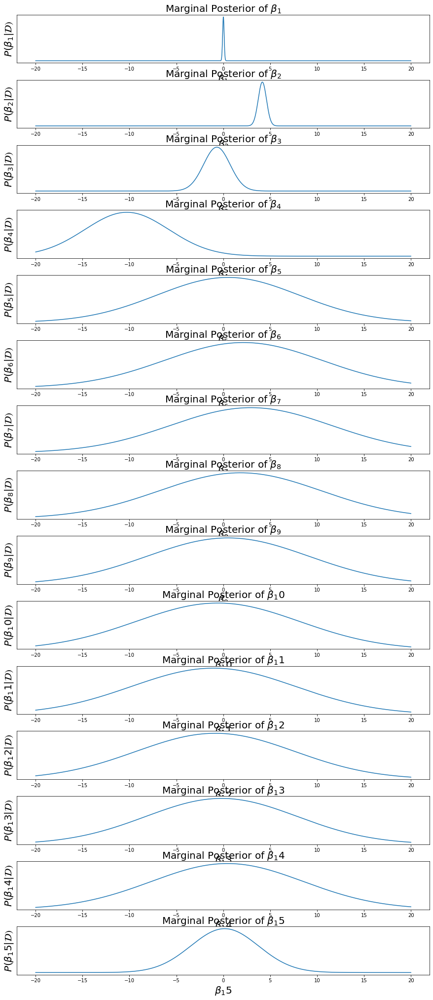

In [413]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

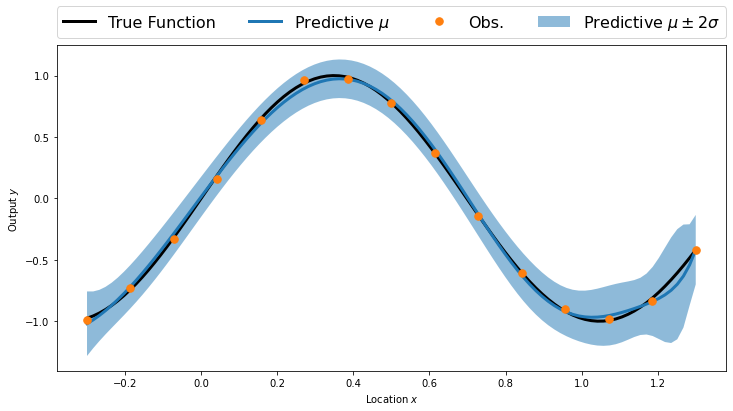

In [414]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [415]:
Loss117 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss217 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss117 , Loss217

(0.098783694, 5124.2354)

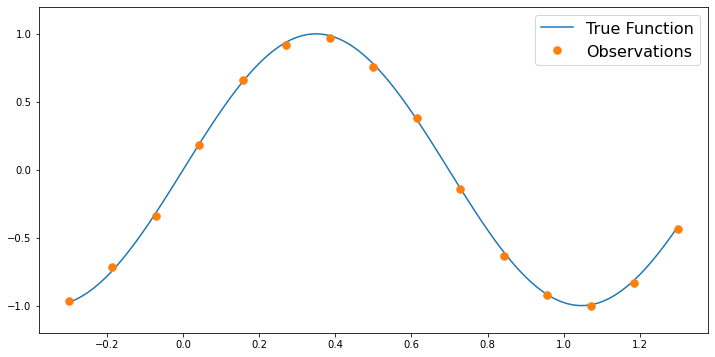

In [406]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 15
trueNoiseStd = 2e-2
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

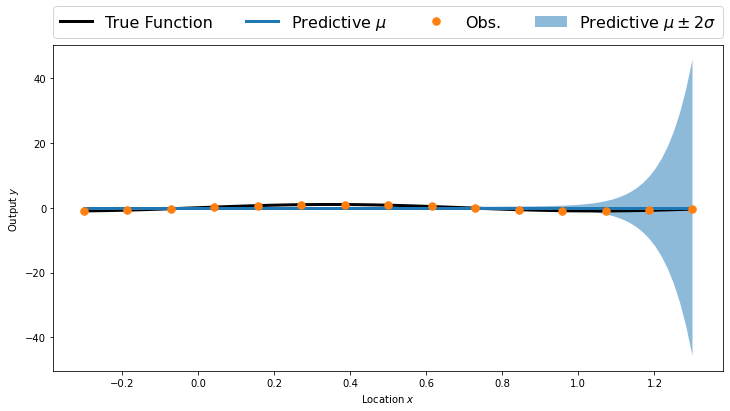

In [407]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  20# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

1.6433287568782976e-10


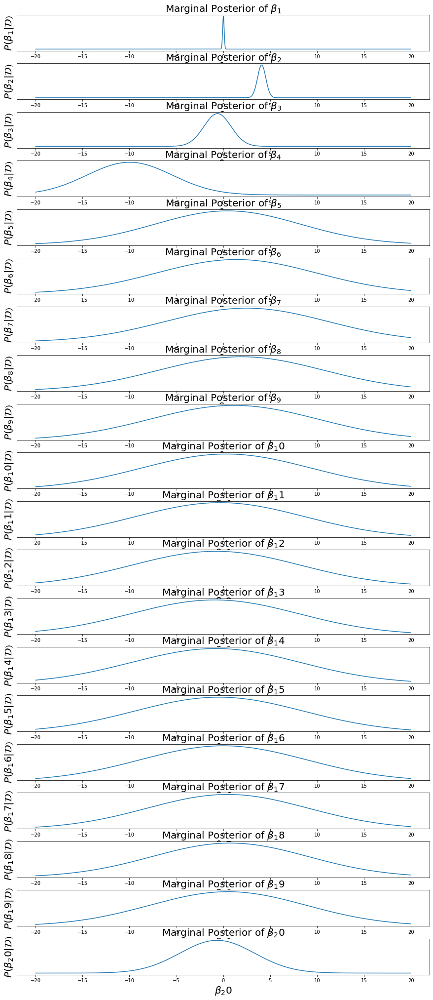

In [408]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

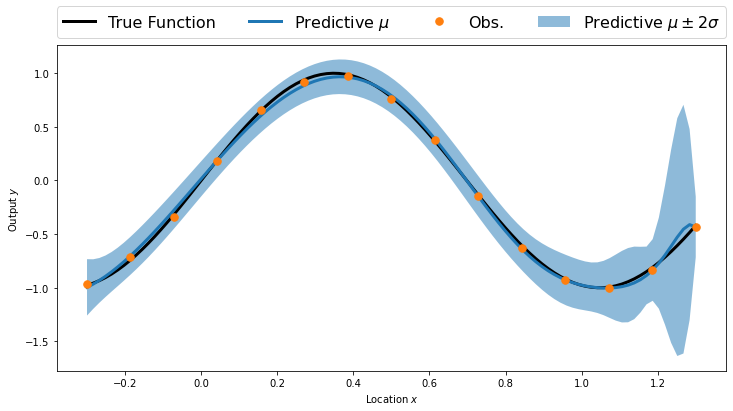

In [409]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [410]:
Loss118 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss218 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss118 , Loss218

(0.10282732, 5129.3066)

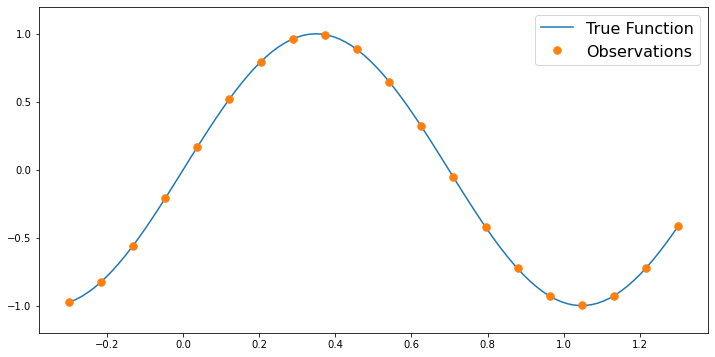

In [416]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 20
trueNoiseStd = 2e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

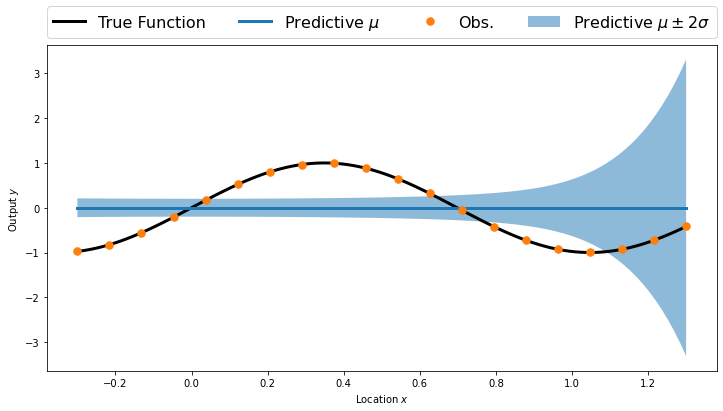

In [417]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  10# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

402.3448449097672


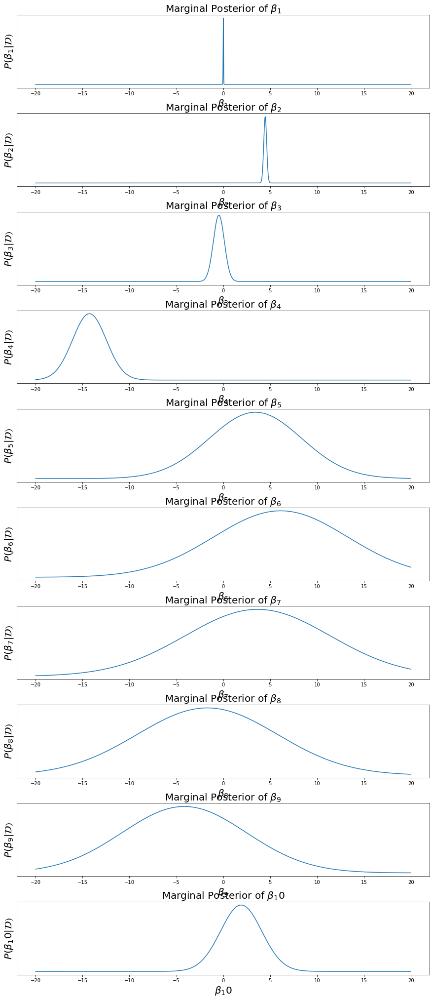

In [418]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

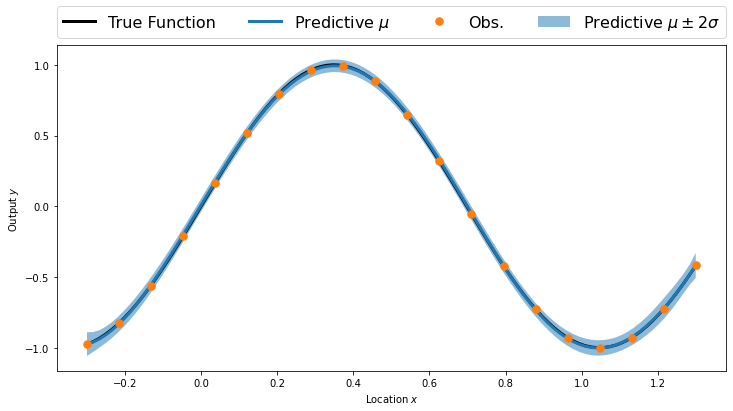

In [419]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [420]:
Loss119 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss219 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss119 , Loss219

(0.0025934165, 5121.418)

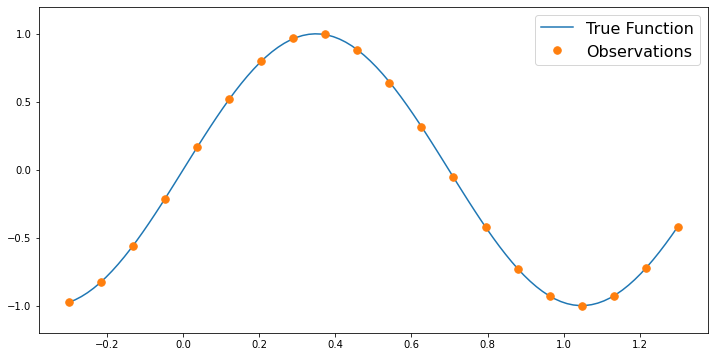

In [421]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 20
trueNoiseStd = 2e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

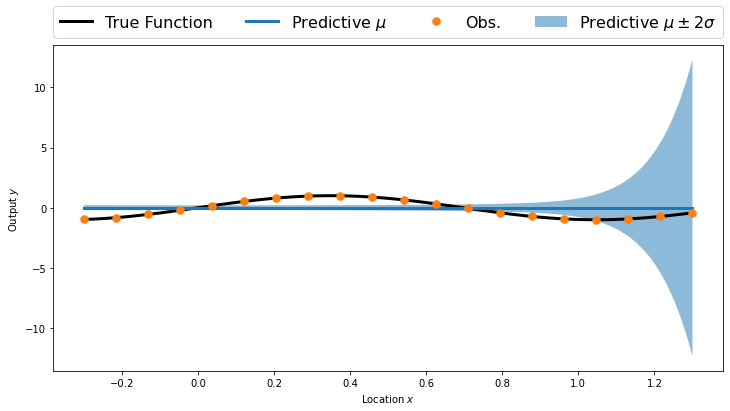

In [422]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  15# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

0.5298899836342541


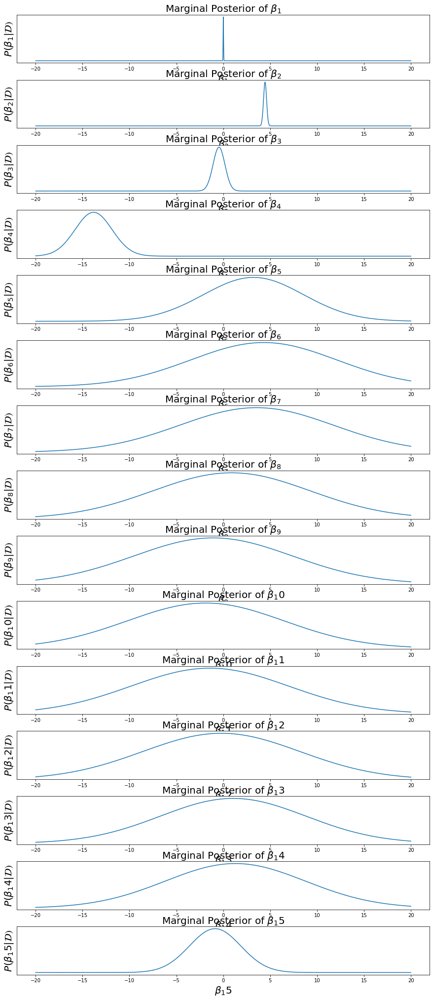

In [423]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

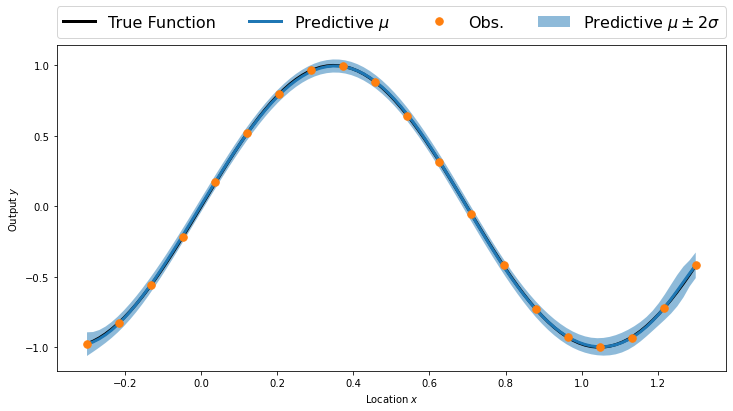

In [424]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [425]:
Loss120 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss220 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss120 , Loss220

(0.002259775, 5121.453)

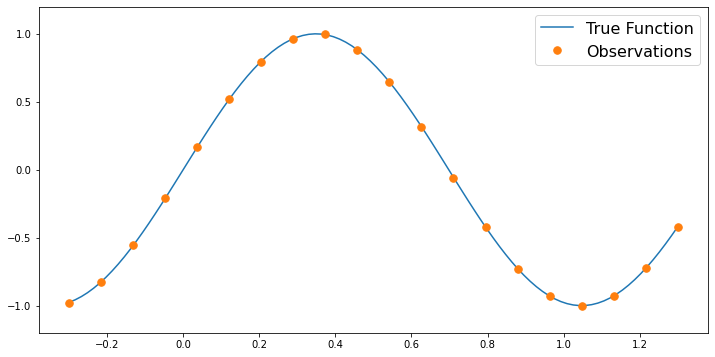

In [426]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 20
trueNoiseStd = 2e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

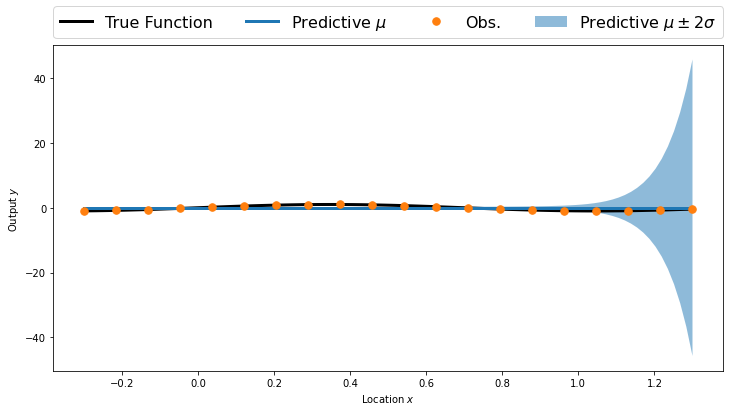

In [427]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  20# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

0.0012775944804687103


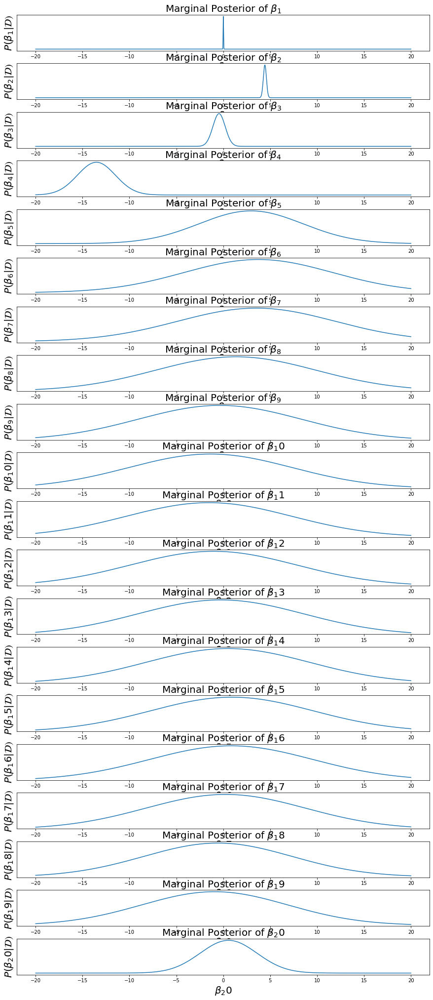

In [428]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

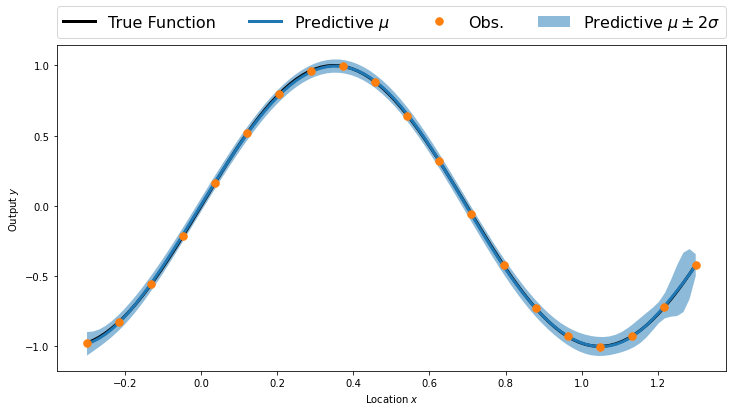

In [429]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [430]:
Loss121 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss221 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss121 , Loss221

(0.0026568025, 5121.0947)

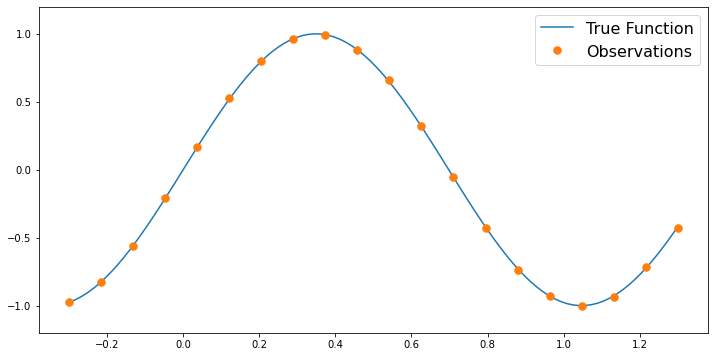

In [431]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 20
trueNoiseStd = 7e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

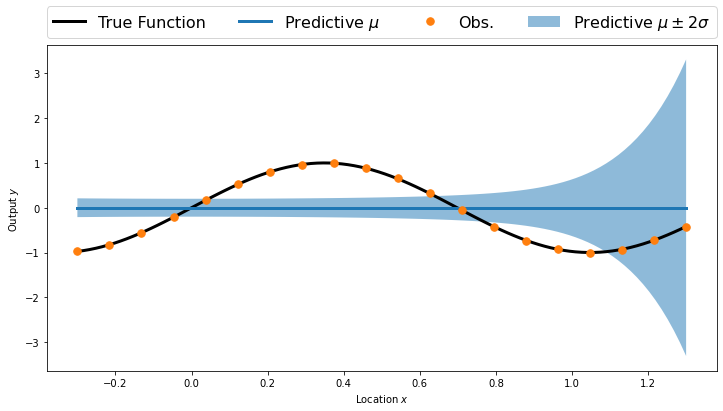

In [432]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  10# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

0.18102728032379656


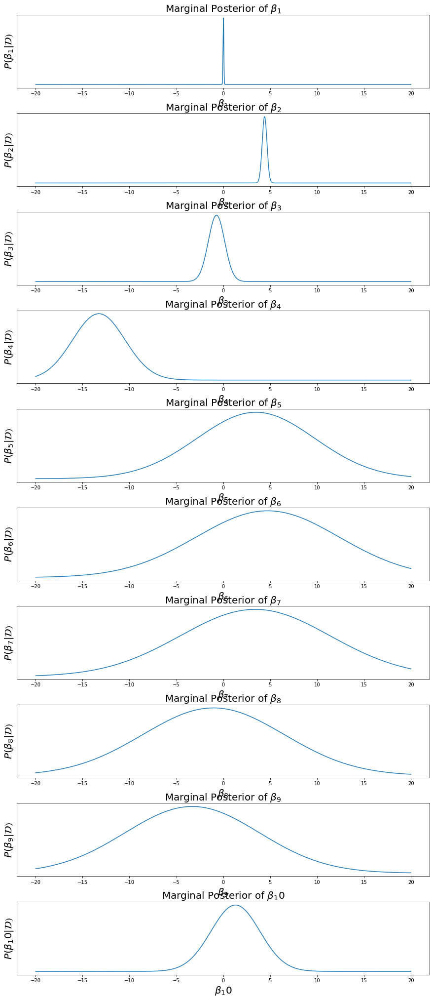

In [433]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

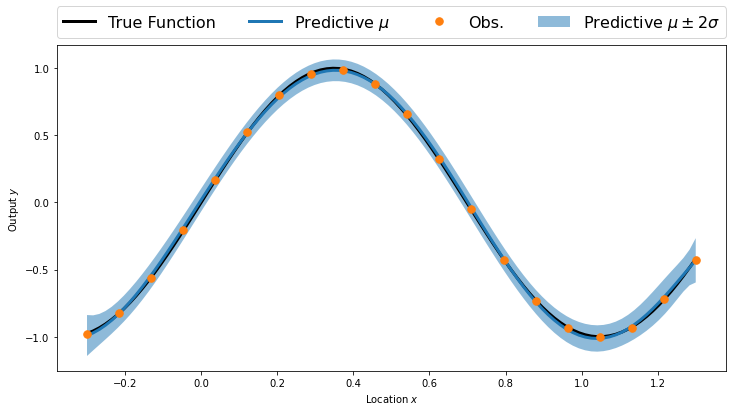

In [434]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [435]:
Loss122 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss222 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss122 , Loss222

(0.01661584, 5121.884)

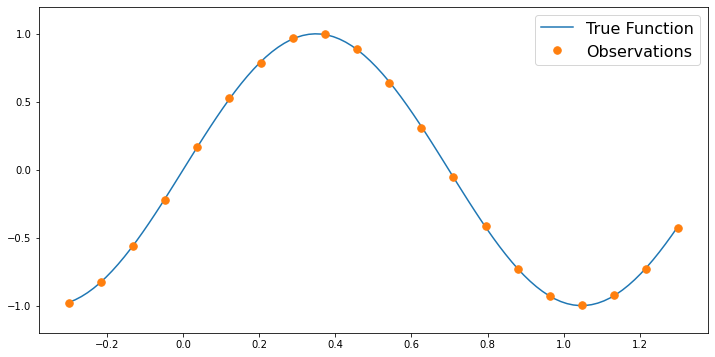

In [436]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 20
trueNoiseStd = 7e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

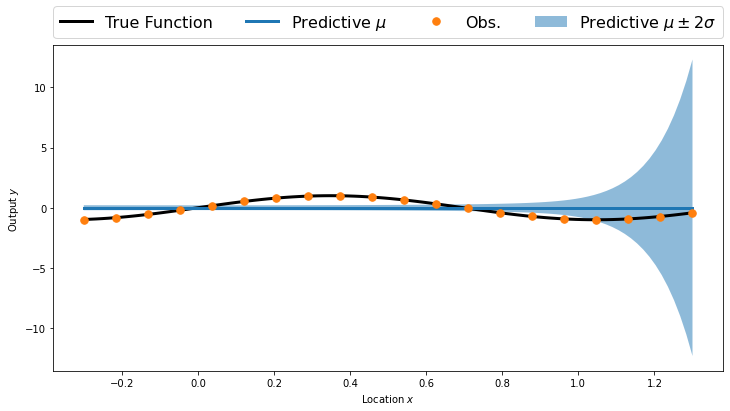

In [437]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  15# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

0.00043699769669381614


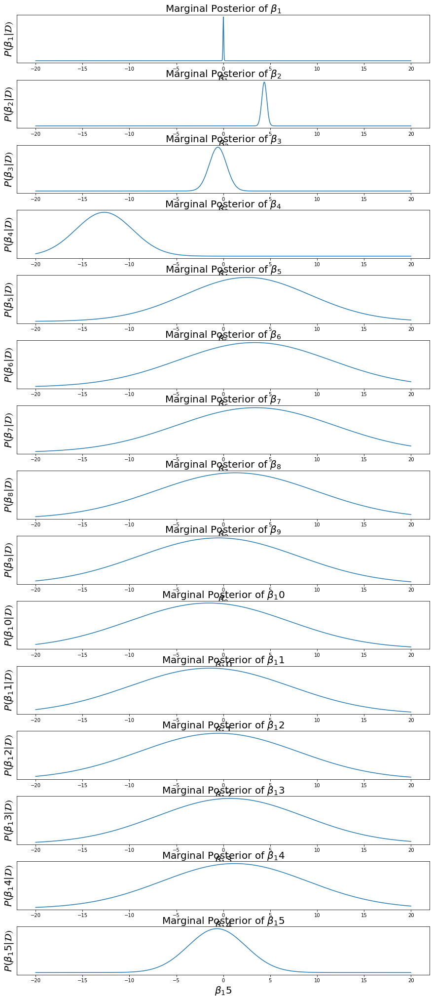

In [438]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

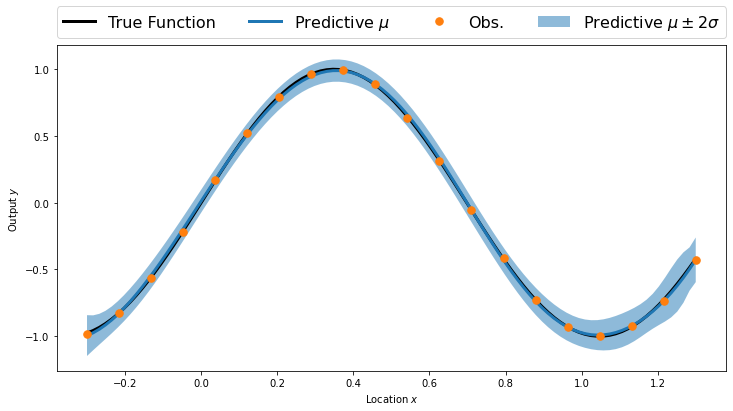

In [440]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [441]:
Loss123 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss223 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss123 , Loss223

(0.010952409, 5121.9165)

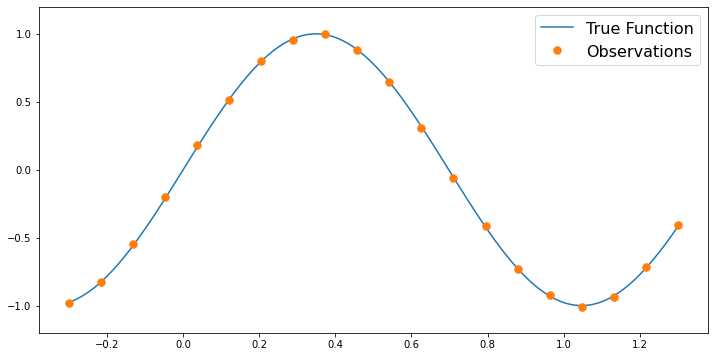

In [442]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 20
trueNoiseStd = 7e-3
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

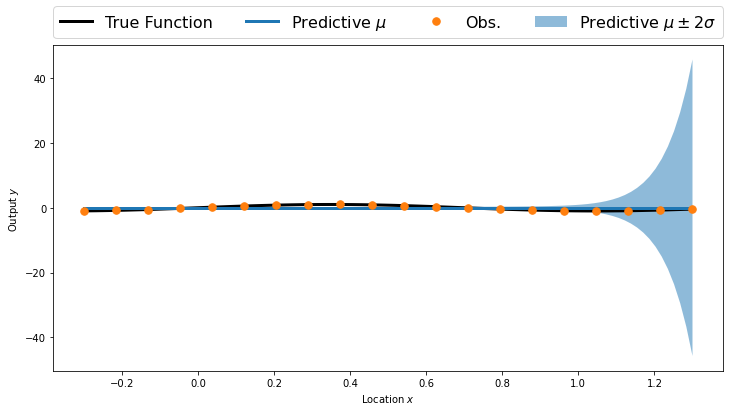

In [443]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  20# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

1.780002154685715e-06


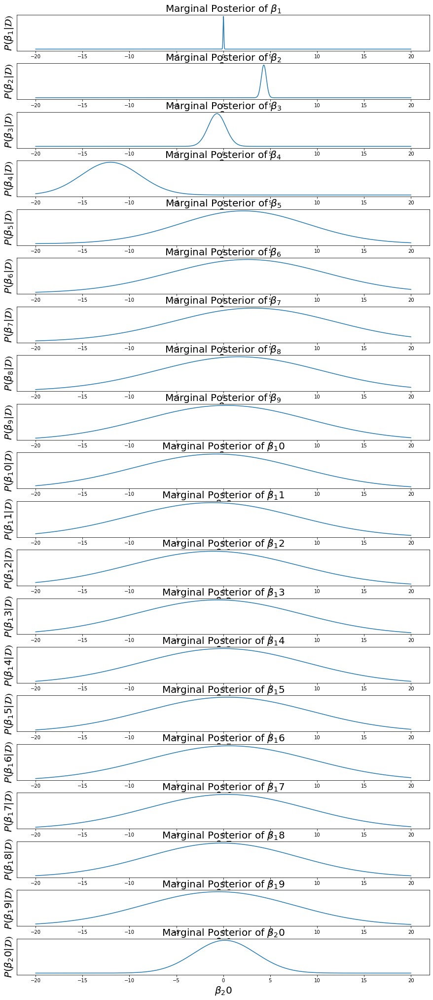

In [444]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

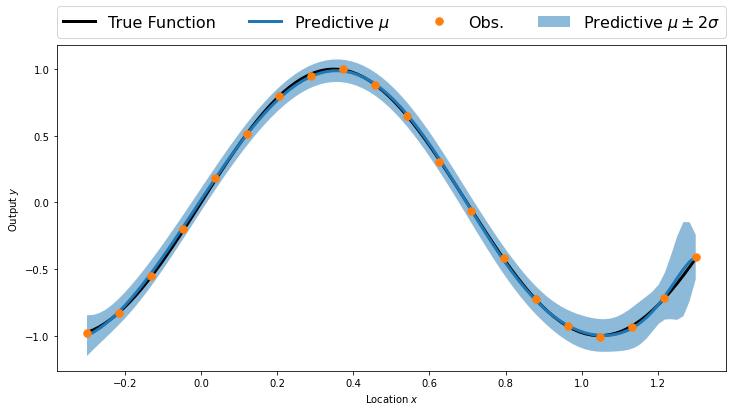

In [445]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [446]:
Loss124 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss224 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss124 , Loss224

(0.022944497, 5122.086)

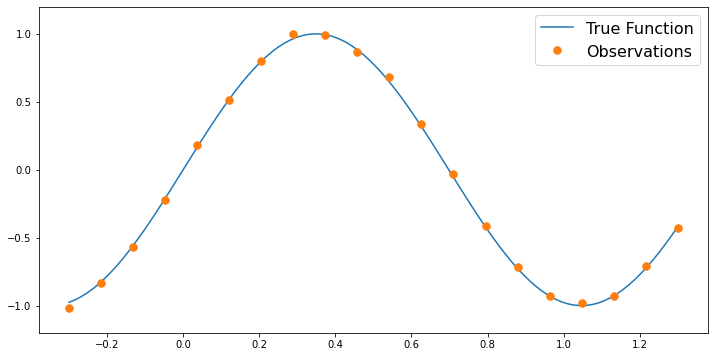

In [447]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 20
trueNoiseStd = 2e-2
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

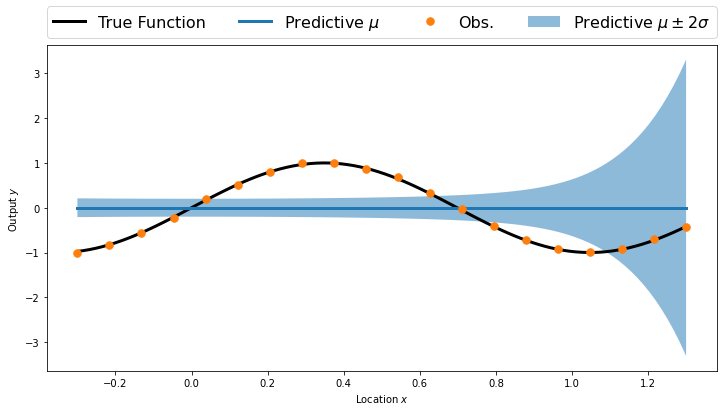

In [448]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  10# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

0.00023851429434084225


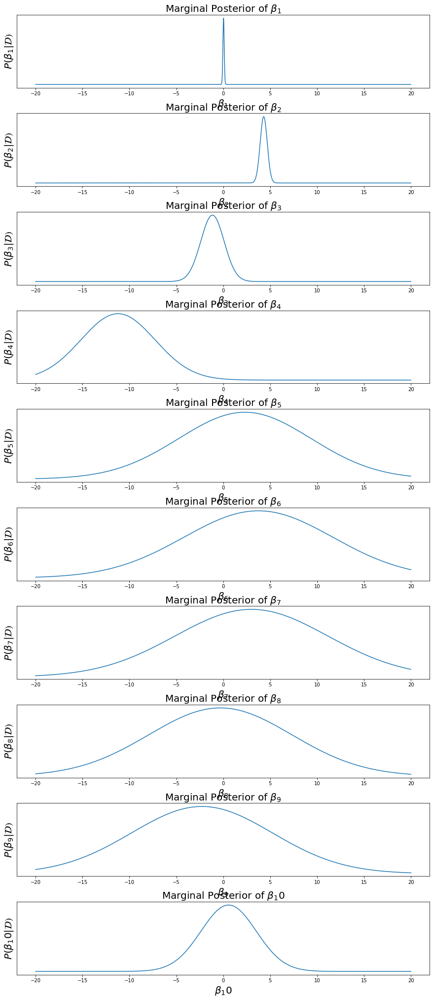

In [449]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

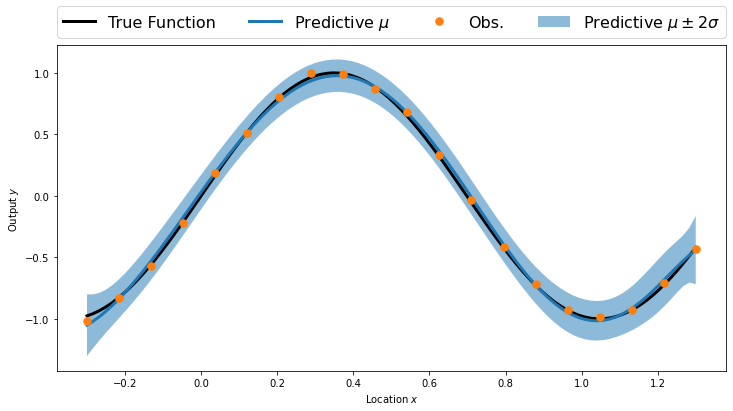

In [450]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [451]:
Loss125 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss225 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss125 , Loss225

(0.07626203, 5123.087)

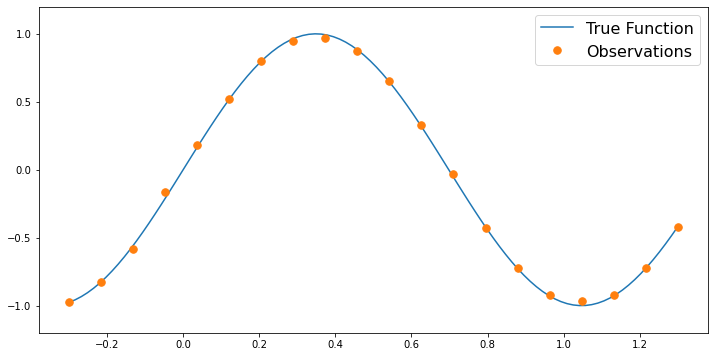

In [452]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 20
trueNoiseStd = 2e-2
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

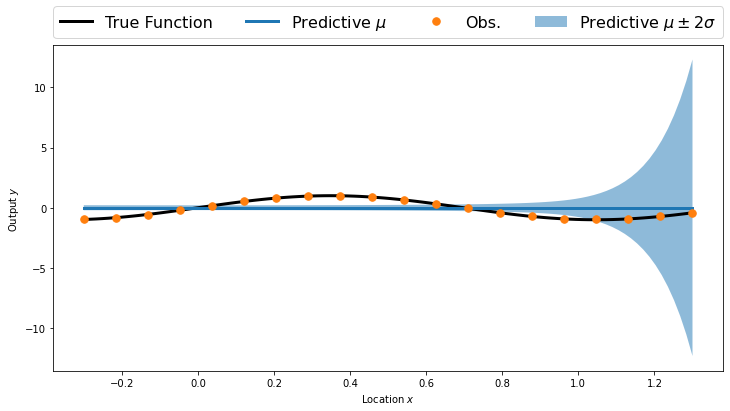

In [453]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  15# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

1.0287052942679505e-06


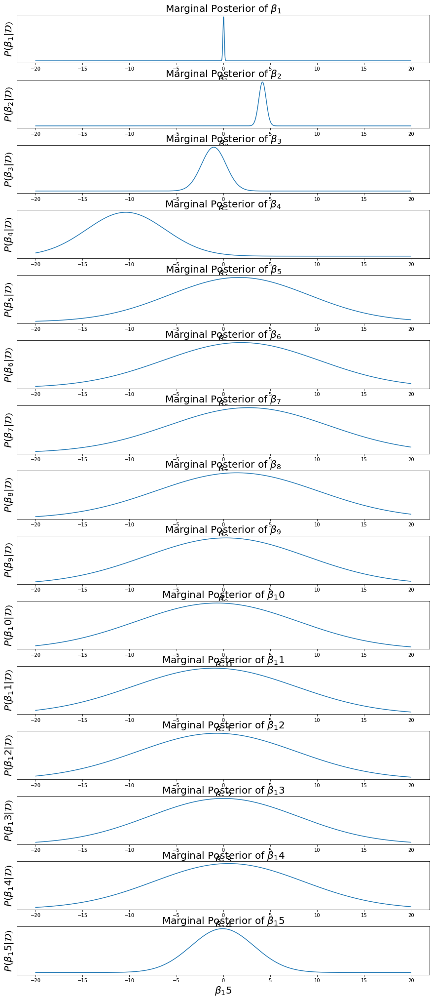

In [454]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

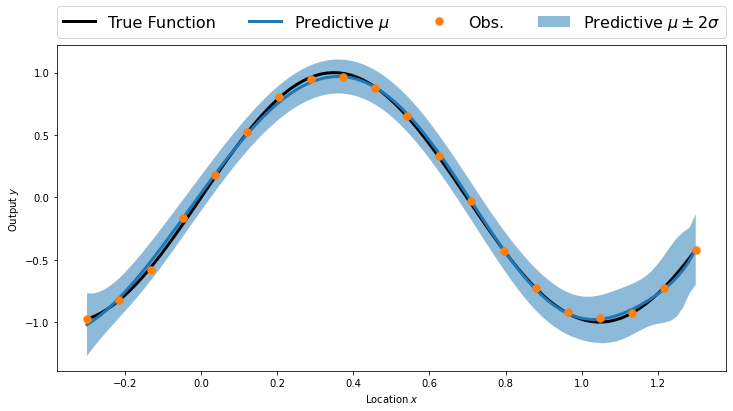

In [455]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [456]:
Loss126 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss226 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss126 , Loss226

(0.06953576, 5123.1934)

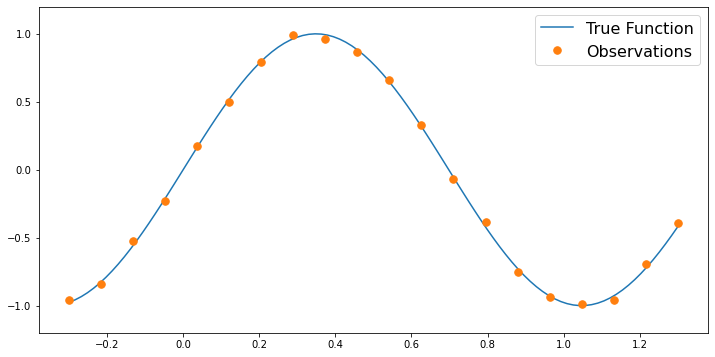

In [457]:
# Generation of the samples that will constitute our training set
xMin=-0.3
xMax=1.3

numObs = 20
trueNoiseStd = 2e-2
obsLocs = np.linspace(xMin,xMax,numObs) # choose data points x equally spaced on [xMin;xMax]

obsData = TrueFunc(obsLocs) + trueNoiseStd*np.random.randn(numObs)
modelNoiseStd = trueNoiseStd
noiseCov = modelNoiseStd * np.eye(numObs) # Covariance matrix of the observations


numPlot = 100

plotx = np.linspace(xMin, xMax, numPlot)

plt.figure(figsize=(12,6))
plt.plot(plotx, TrueFunc(plotx),label='True Function')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Observations')

plt.ylim([-1.2,1.2])
plt.legend(fontsize=16)

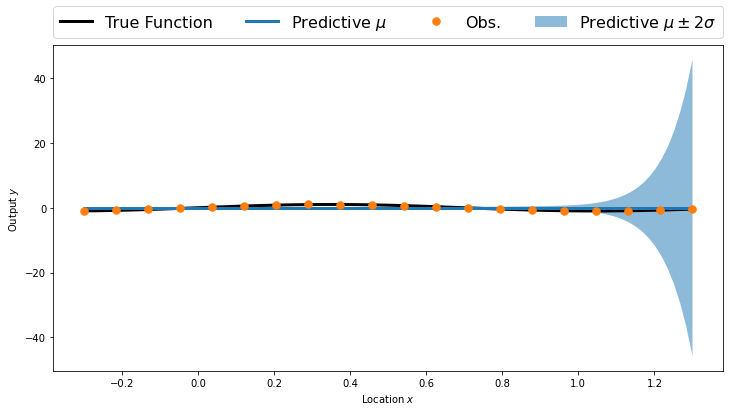

In [458]:
# Designing the matrix B containing the basis functions on the training set
polyOrder =  20# number of polynoms/regression coefficients

B = np.ones((numObs,polyOrder))
for p in range(1,polyOrder): 
    B[:,p] = np.power(obsLocs, p)
#print(B)
# Setting the values for the prior distribution on the regression coefficients

priorMean = np.zeros(polyOrder)
priorCov = (100)*np.eye(polyOrder)

predB = np.ones((numPlot,polyOrder))
for p in range(1,polyOrder): 
    predB[:,p] = np.power(plotx, p)
    
predMean = np.dot(predB, priorMean)
predCov = np.dot(predB, np.dot(priorCov, predB.T))

predStd = np.sqrt(np.diag(predCov))


plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-.020*predStd, predMean+0.020*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

4.6302367352350305e-09


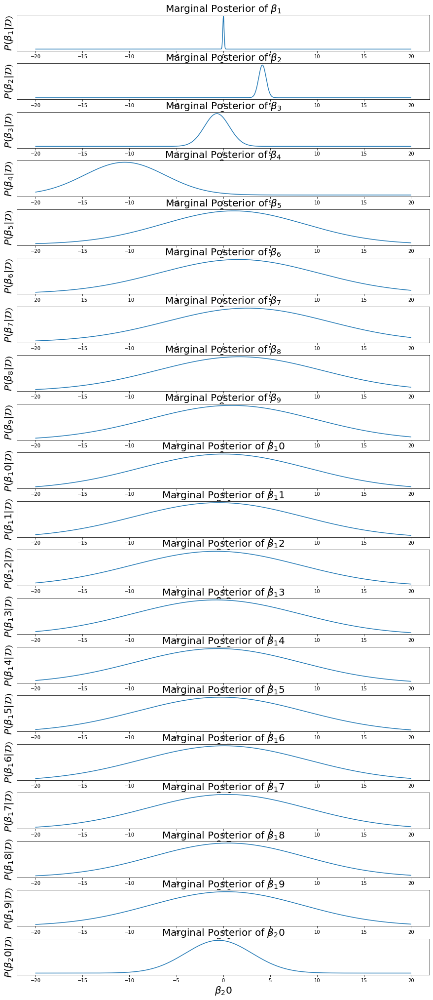

In [459]:
predCov=np.dot(np.dot(B,priorCov),B.T)+noiseCov
predMean=np.dot(B,priorMean)

from scipy.stats import multivariate_normal
marginalLikelihood = multivariate_normal.pdf(obsData,predMean,predCov)
print(marginalLikelihood)

ProductK=np.dot(np.dot(priorCov,B.T),np.linalg.inv(predCov))

postMean=priorMean+np.dot(ProductK,(obsData-predMean))
postCov=np.dot((np.eye(polyOrder)-np.dot(ProductK,B)),priorCov)
#print(postMean)
#print(postCov)


BetaGrid = np.linspace(-10, 10, 1000)


fig, axes = plt.subplots(nrows=polyOrder,figsize=(15,15))
fig.tight_layout()#(wspace = 0.2)
for i in range(polyOrder):
    plot_posterior(postMean[i],postCov[i,i],i, ax=axes[i])
    axes[i].set_yticks([])
    

plt.subplots_adjust(left=0.125,
                    bottom=0, 
                    right=0.9, 
                    top=1.8, 
                    wspace=10, 
                    hspace=0.35)    

plt.show()

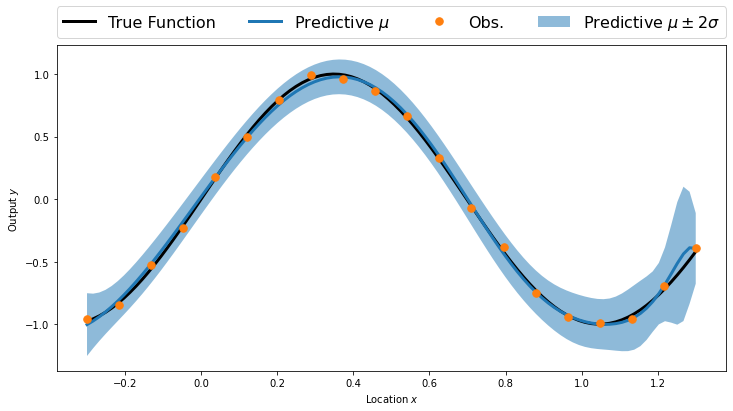

In [460]:
predMean = np.dot(predB, postMean)
predCov = np.dot(predB, np.dot(postCov, predB.T))

predStd = np.sqrt(np.diag(predCov))

plt.figure(figsize=(12,6))

plt.fill_between(plotx, predMean-2.0*predStd, predMean+2.0*predStd, alpha=0.5, label='Predictive $\mu\pm2\sigma$')
plt.plot(plotx
         , TrueFunc(plotx), 'k', linewidth=3, label='True Function')
plt.plot(plotx, predMean, linewidth=3, label='Predictive $\mu$')
plt.plot(obsLocs,obsData,'.', markersize=15, label = 'Obs.')

plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=4, mode="expand", borderaxespad=0., fontsize=16)
plt.xlabel('Location $x$')
plt.ylabel('Output $y$')
plt.show()

In [461]:
Loss127 = np.sum(pow(TrueFunc(plotx)-predMean,2), dtype = np.float32)
Loss227 = np.sum(pow(TrueFunc(plotx)-predCov,2), dtype = np.float32)
Loss127 , Loss227

(0.08631044, 5123.5254)

On remarque que : 

    - Plus le nombre d'observations est grand, plus la variance des fonctions prédictives est uniformément répartie.

    - Plus le bruit est petit, plus les points sont proches de notre true function, et plus les distributions normales sont étroites.

    - Plus le nombre de distributions marginales posterieures est petit, plus la variance des fonctions prédictives est, sensiblement, uniformément répartie.

In [463]:
Loss1 = [Loss11,Loss12,Loss13,Loss14,Loss15,Loss16,Loss17,Loss18,Loss19,Loss110,Loss111,Loss112,Loss113,Loss114,Loss115,Loss116,Loss117,Loss118,Loss119,Loss120,Loss121,Loss122,Loss123,Loss124,Loss125,Loss126,Loss127]
Loss1

[0.008906455,
 0.019897131,
 3.4927654,
 0.036287885,
 0.2752857,
 0.8334709,
 0.1961918,
 0.40641618,
 1.0653485,
 0.0036039457,
 0.003994103,
 0.0049697487,
 0.018377397,
 0.020315913,
 0.06704466,
 0.0032685036,
 0.098783694,
 0.10282732,
 0.0025934165,
 0.002259775,
 0.0026568025,
 0.01661584,
 0.010952409,
 0.022944497,
 0.07626203,
 0.06953576,
 0.08631044]

In [468]:
mini1 = min(Loss1)
res1 = [i for i, j in enumerate(Loss1) if j == mini1]
res1

[19]

En prenant comme critère de décision l'erreur quadratique entre la truefunction et la moyenne de nos prédictions pour un triplet de paramètres (numObs,trueNoiseStd,polyOrder), on en déduit que le triplet (10,2e-3,10) est notre meilleur choix parmi les triplets de paramètres considérés.

In [464]:
Loss2 = [Loss21,Loss22,Loss23,Loss24,Loss25,Loss26,Loss27,Loss28,Loss29,Loss210,Loss211,Loss212,Loss213,Loss214,Loss215,Loss216,Loss217,Loss218,Loss219,Loss220,Loss221,Loss222,Loss223,Loss224,Loss225,Loss226,Loss227]
Loss2

[5121.7715,
 5126.368,
 6223.1313,
 5122.977,
 5132.5005,
 7310.575,
 5125.7524,
 5145.7627,
 9352.105,
 5121.491,
 5121.556,
 5122.6064,
 5122.1274,
 5122.3,
 5124.678,
 5121.491,
 5124.2354,
 5129.3066,
 5121.418,
 5121.453,
 5121.0947,
 5121.884,
 5121.9165,
 5122.086,
 5123.087,
 5123.1934,
 5123.5254]

In [469]:
mini2 = min(Loss2)
res2 = [i for i, j in enumerate(Loss2) if j == mini2]
res2

[20]

En prenant comme critère de décision l'erreur quadratique entre la truefunction et la variance de nos prédictions pour un triplet de paramètres (numObs,trueNoiseStd,polyOrder), on en déduit que le triplet (10,2e-3,15) est notre meilleur choix parmi les triplets de paramètres considérés.

<span style='color:gray;float:right'>----
    *François Septier - Copernicus Master in Digital Earth*</span>